# Seed


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from numpy.random import seed
seed(3)

# Import de fonctions

In [ ]:
import matplotlib.pyplot as plt
import sklearn
from sklearn.metrics import adjusted_rand_score as ARI
from sklearn.metrics import adjusted_mutual_info_score as AMI
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import v_measure_score
from skimage.transform import resize
from sklearn.mixture import GaussianMixture
from scipy.stats import wasserstein_distance
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import numpy as np
import datetime
import torch
import sys
from scipy.special import logsumexp
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from torch.optim.lr_scheduler import StepLR
from matplotlib.patches import Patch
from sklearn.preprocessing import normalize
!pip install umap-learn
import umap
from sklearn.manifold import TSNE
import plotly.express as px

# Dataset des chiffres du MNIST
from keras.datasets import mnist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=90a3654364557409d2196ba621db47340b4b7cc07b19093ccee7aceecc869508
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=4aad881bece0bed90849dcc9ac12a7ff2455d94f47c543cdbd4d205b67fb1947
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [ ]:
@torch.no_grad()
def distributed_sinkhorn(out, epsilon=0.05, sinkhorn_iterations=15):
    Q = torch.exp(out / epsilon).t() # Q is K-by-B for consistency with notations from our paper
    B = Q.shape[1] # / world_size  # number of samples to assign
    K = Q.shape[0] # how many prototypes

    # make the matrix sums to 1
    sum_Q = torch.nansum(Q)
    Q /= (sum_Q + 1e-5)

    for it in range(sinkhorn_iterations):
        # normalize each row: total weight per prototype must be 1/K
        sum_of_rows = torch.nansum(Q, dim=1, keepdim=True)
        Q /= (sum_of_rows + 1e-5)
        Q /= (K + 1e-5)

        # normalize each column: total weight per sample must be 1/B
        Q /= torch.nansum(Q, dim=0, keepdim=True)
        Q /= (B + 1e-5)

    Q *= B  # the columns must sum to 1 so that Q is an assignment
    return Q.t()


In [ ]:
colors_per_cluster = {
                      -1:np.array([0.4,0.4,0.4]),
                      0:np.array([0.9,0.05,0.05]),
                      1:np.array([0.15,0.15,0.85])
                      }

# scale and move the coordinates so they fit [0; 1] range
def scale_to_01_range(x):
    # compute the distribution range
    value_range = (np.max(x) - np.min(x))
    # move the distribution so that it starts from zero
    # by extracting the minimal value from all its values
    starts_from_zero = x - np.min(x)
    # make the distribution fit [0; 1] by dividing by its range
    return starts_from_zero / value_range

# Compute the coordinates of the image on the plot
def compute_plot_coordinates(image, x, y, image_centers_area_size, offset=8):
    image_height, image_width, _ = image.shape
    # compute the image center coordinates on the plot
    center_x = int(image_centers_area_size * x) + offset
    # in matplotlib, the y axis is directed upward
    # to have the same here, we need to mirror the y coordinate
    center_y = int(image_centers_area_size * (1 - y)) + offset
    # knowing the image center,
    # compute the coordinates of the top left and bottom right corner
    tl_x = center_x - int(image_width / 2)
    tl_y = center_y - int(image_height / 2)
    br_x = tl_x + image_width
    br_y = tl_y + image_height
    return tl_x, tl_y, br_x, br_y

def draw_rectangle_by_conditional_pred(image, label_pred_conditionnaly_to_cluster, plot_neg=True, false_pred=False) :
  image = np.stack((image,)*3, axis=-1)

  if false_pred :
    color = np.array([0.05,1,0.05])
  elif plot_neg :
    color = colors_per_cluster[0]*label_pred_conditionnaly_to_cluster[0] + colors_per_cluster[-1]*(1-label_pred_conditionnaly_to_cluster[0])
    color += colors_per_cluster[1]*label_pred_conditionnaly_to_cluster[1] + colors_per_cluster[-1]*(1-label_pred_conditionnaly_to_cluster[1])
    color = color / 2
  else :
    color = colors_per_cluster[0]*label_pred_conditionnaly_to_cluster[0]
    color += colors_per_cluster[1]*label_pred_conditionnaly_to_cluster[1]
  image[:2,:,:] = color
  image[:,-2:,:] = color
  image[-2:,:,:] = color
  image[:,:2,:] = color
  return image

def create_visualization(two_dim_latent_space, X_test, y_test, y_ground_truth, y_pred) :
  img_dim = 32
  offset = img_dim // 2 + 1
  huge_image_size = 2*250

  # extract x and y coordinates representing the positions of the images on T-SNE plot
  two_dim_latent_space = sklearn.preprocessing.RobustScaler().fit_transform(two_dim_latent_space)
  tx = two_dim_latent_space[:, 0]
  ty = two_dim_latent_space[:, 1]
  tx = scale_to_01_range(tx)
  ty = scale_to_01_range(ty)

  # init the plot as white canvas
  tsne_plot = np.ones((huge_image_size+2*offset+1, huge_image_size+2*offset+1, 3))

  c=0
  t=0
  # now we'll put a small copy of every image to its corresponding latent space coordinate
  for image, label, pred, x, y in zip(X_test, y_test, y_pred, tx, ty) :
      if label != 7 :
        if np.random.uniform(0,1) > 0.99 :
          continue
      elif c >= len(y_ground_truth) :
        continue
      else :
        cluster=y_ground_truth[c]
        c+=1
      image = np.reshape(image, (img_dim,img_dim))
      if label==7 and  cluster==0 :
        image = draw_rectangle_by_conditional_pred(image, {0:0, 1:1}, plot_neg=False)
      if label==7 and cluster==1 :
        image = draw_rectangle_by_conditional_pred(image, {0:1, 1:0}, plot_neg=False)
      if label!=7 :
        image = draw_rectangle_by_conditional_pred(image, {0:0, 1:0})
      # compute the coordinates of the image on the scaled plot visualization
      tl_x, tl_y, br_x, br_y = compute_plot_coordinates(image, x, y, huge_image_size)
      # put the image to its t-SNE coordinates using numpy sub-array indices
      if np.sum(tsne_plot[tl_y:br_y, tl_x:br_x])/3 > (img_dim**2-(offset-1)**2) :
        tsne_plot[tl_y:br_y, tl_x:br_x, :] = image
        t=t+1


  fig = plt.figure(figsize=(10, 10))

  legend_elements = [Patch(label='Negative class', fill=False, edgecolor='#999999', linewidth=3),
                    Patch(label='Subgroup 0', fill=False, edgecolor='b', linewidth=3),
                    Patch(label='Subgroup 1', fill=False, edgecolor='r', linewidth=3),]

  plt.axis('off')
  # plt.legend(handles=legend_elements, loc='lower right', prop={'size': 10})
  plt.imshow(tsne_plot)
  plt.show()




In [ ]:
# load ground truth label
import json

label_mapping_seven = {'No bar':0, 'With bar':1}
with open("/content/drive/MyDrive/Neurospin/Thèse Robin/UCSL/mnist_labels.json") as json_file:
    ground_truth_dict = json.load(json_file)
    y_ground_truth = np.array([label_mapping_seven[ground_truth_dict[key]] for key in ground_truth_dict.keys()])

# Define models and datasets

In [ ]:
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
import torchvision.models as models
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import torch

pos_label = 7

(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = np.array([np.pad(img, 2) for img in X_train])
X_test = np.array([np.pad(img, 2) for img in X_test])

train_indices = []
test_indices = []

c=0
for (i, y_i) in enumerate(y_train) :
  if y_i in [pos_label] :
    train_indices.append(i)
    c+=1
  else :
    if len(train_indices) < 2*c :
      train_indices.append(i)

c=0
for (i, y_i) in enumerate(y_test) :
  if y_i in [pos_label] :
    test_indices.append(i)
    c+=1
  else :
    if len(test_indices) < 2*c :
      test_indices.append(i)

train_indices = np.array(train_indices)
test_indices = np.array(test_indices)

X_train = X_train[train_indices]
X_test = X_test[test_indices]
y_train = y_train[train_indices]
y_test = y_test[test_indices]

# flatten the images
n_samples_train = len(X_train)
X_train = X_train.reshape((n_samples_train, -1))
X_train = X_train - np.min(X_train, 1)[:, None]
X_train = X_train / np.max(X_train, 1)[:, None]

n_samples_test = len(X_test)
X_test = X_test.reshape((n_samples_test, -1))
X_test = X_test - np.min(X_test, 1)[:, None]
X_test = X_test / np.max(X_test, 1)[:, None]

X_train = np.array(X_train).astype(np.float)
X_test = np.array(X_test).astype(np.float)
y_train = np.array(y_train).astype(np.float)
y_test = np.array(y_test).astype(np.float)

X_train = np.reshape(X_train, (-1, 32, 32))
X_test = np.reshape(X_test, (-1, 32, 32))

X_train = X_train[y_train==7]
X_test = X_test[y_test==7]

11490434/11490434 [==============================] - 0s 0us/step


<ipython-input-7-8edbd5ae97bc>:58: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X_train = np.array(X_train).astype(np.float)
<ipython-input-7-8edbd5ae97bc>:59: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X_test = np.array(X_test).astype(np.float)
<ipython-input-7-8edbd5ae97bc>:60: DeprecationWarning: `np.float` is a deprecated alias fo

# Dataset and Model Architecture

In [ ]:
class MyDataset(Dataset):
    def __init__(self, data, test=False):
        self.data = data
        self.transform = transforms.Compose([
                            transforms.ToTensor(),
                            transforms.RandomRotation(25),
                            transforms.RandomAffine(15, translate=(0.1, 0.1), shear=0.1),
                        ])
        self.test = test

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        x = self.data[index]
        if not self.test :
          x_1 = self.transform(x).float()
        else :
          x_1 = torch.tensor(x)[None,:,:].float()
        x_2 = self.transform(x).float()
        return x_1.cuda(), x_2.cuda()


In [ ]:
# Simple
class SimpleConditionalConvNet(nn.Module):
    def __init__(self, nc, nz, n_clusters, kernel_size=7):
        super(SimpleConditionalConvNet, self).__init__()
        padding = kernel_size // 2
        layers = [
            nn.Conv2d(nc, 16, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Conv2d(16, 32, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 64, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        ]
        self.extracter = nn.Sequential(*layers)
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc1 = nn.Linear(128, nz)
        self.prototypes = nn.Linear(nz, n_clusters, bias=False)
        self.prototypes.weight.data = torch.nn.functional.normalize(self.prototypes.weight.data, dim=1, p=2)
        self.softmax = nn.Softmax(dim=-1)
        self.temperature = 0.1

    def forward(self, x):
        encoded_vectors = self.extracter(x)
        encoded_vectors = self.avgpool(encoded_vectors)
        encoded_vectors = torch.flatten(encoded_vectors, 1).view(encoded_vectors.size(0), -1)
        encoded_vectors = self.fc1(encoded_vectors)
        encoded_vectors =  torch.nn.functional.normalize(encoded_vectors, dim=1, p=2)
        clustering_probabilities = self.softmax(self.prototypes(encoded_vectors) / self.temperature)
        return encoded_vectors, clustering_probabilities

# model parameters
nz = 128
nc = 1
n_clusters=2

# SWaV

Epoch: 1 	Training Loss: 95.972272


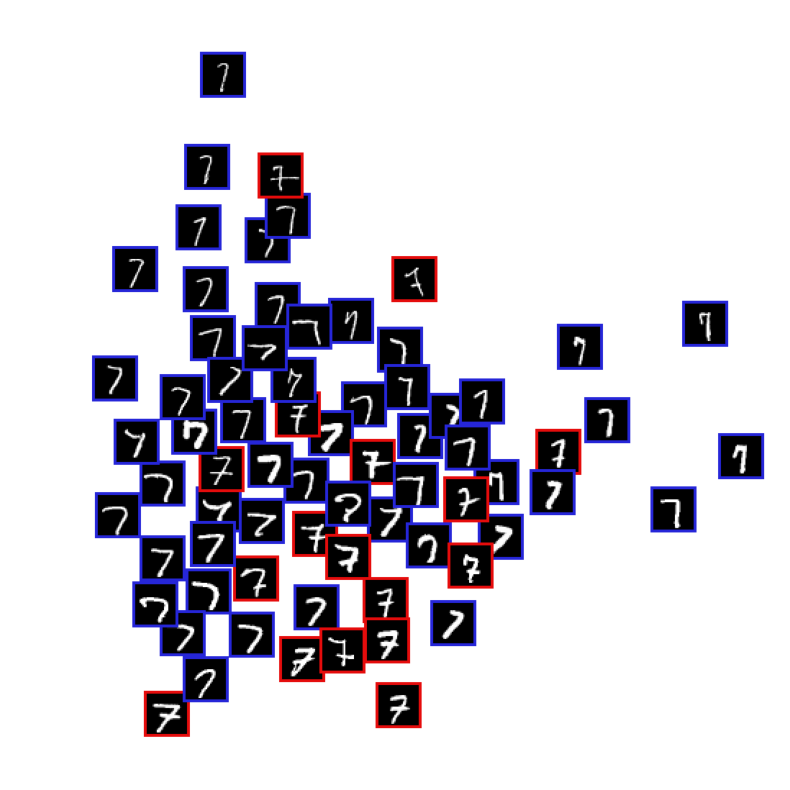

772
256
GM balanced accuracy score with hand-crafted labels :  0.5976127684351131
GM ari with hand-crafted labels :  -0.05110772309302131
GM vm with hand-crafted labels :  0.032782050371424336
Epoch: 2 	Training Loss: 37.279538


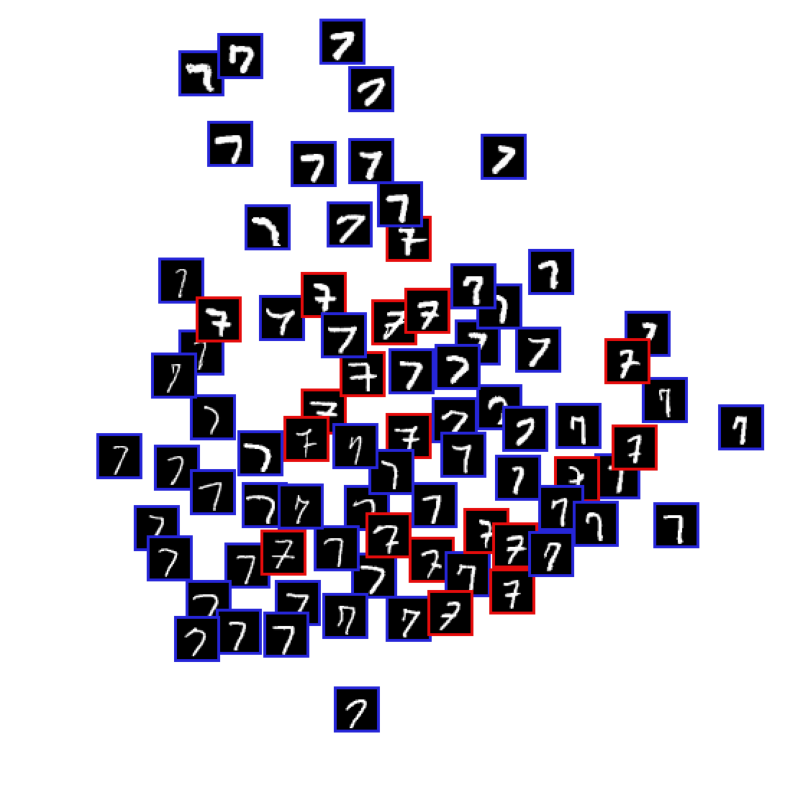

573
455
GM balanced accuracy score with hand-crafted labels :  0.6041545364249752
GM ari with hand-crafted labels :  0.017811682428891234
GM vm with hand-crafted labels :  0.02411711742669293
Epoch: 3 	Training Loss: 25.913255


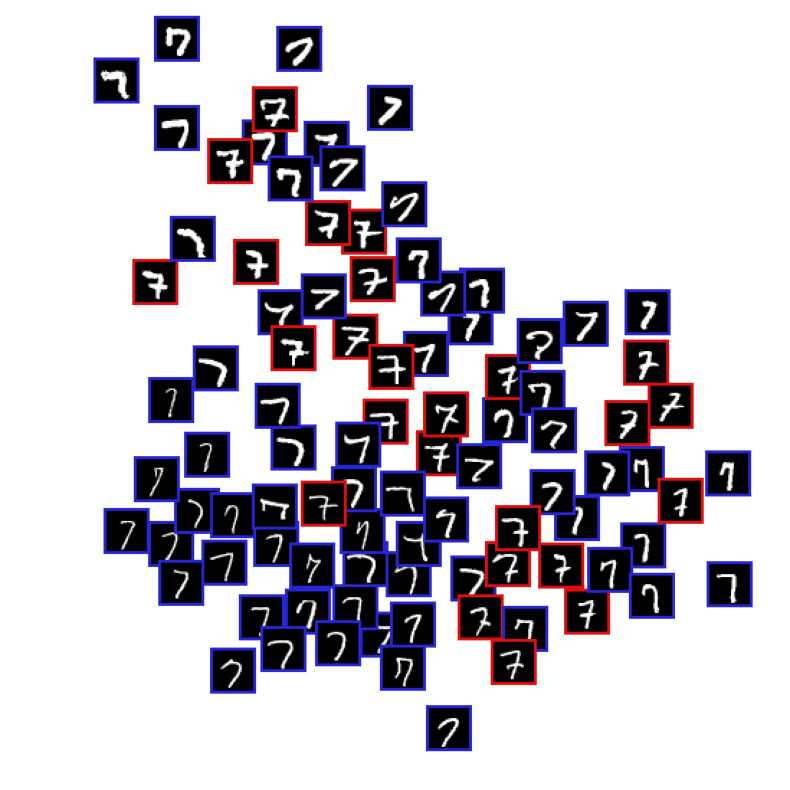

529
499
GM balanced accuracy score with hand-crafted labels :  0.6003185258759461
GM ari with hand-crafted labels :  0.023884413351349592
GM vm with hand-crafted labels :  0.02202355739014961
Epoch: 4 	Training Loss: 21.208671


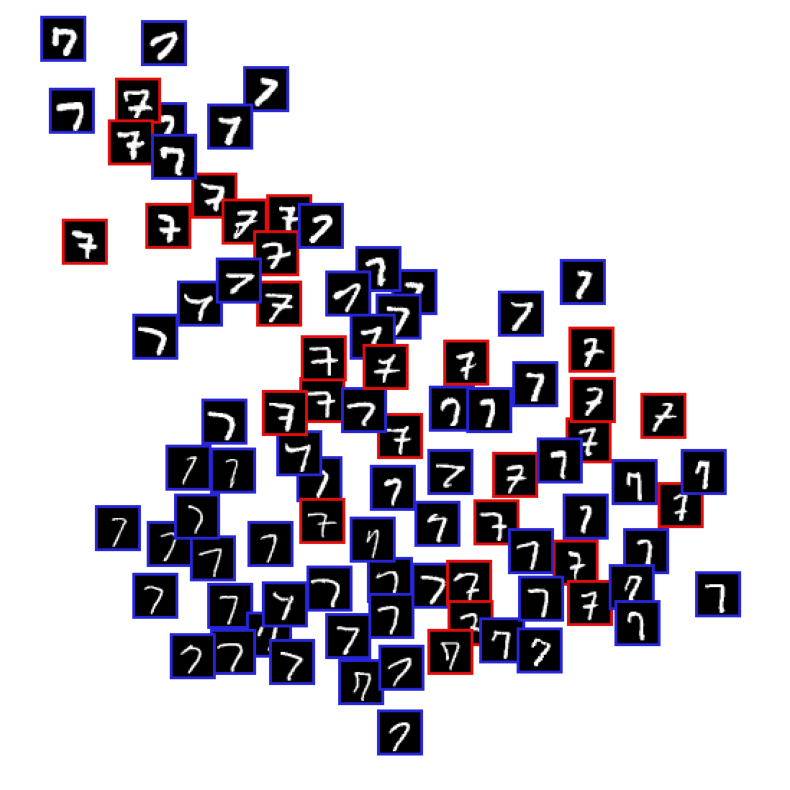

511
517
GM balanced accuracy score with hand-crafted labels :  0.5863444874473405
GM ari with hand-crafted labels :  0.022955740259061753
GM vm with hand-crafted labels :  0.01574290169987519
Epoch: 5 	Training Loss: 18.427085


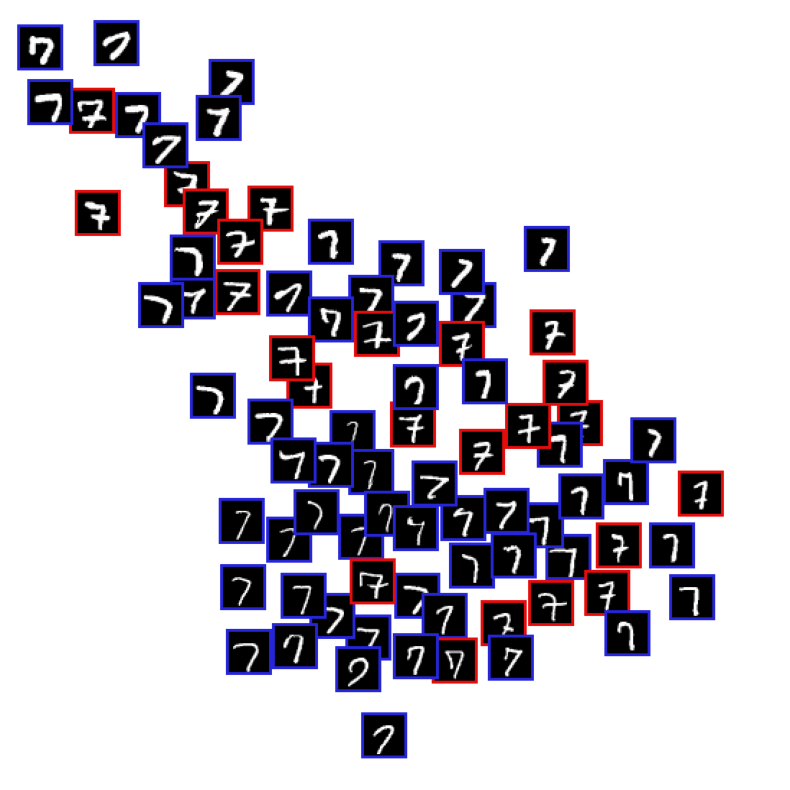

498
530
GM balanced accuracy score with hand-crafted labels :  0.5911566256807206
GM ari with hand-crafted labels :  0.03021350926491968
GM vm with hand-crafted labels :  0.017862262981363362
Epoch: 6 	Training Loss: 16.588781


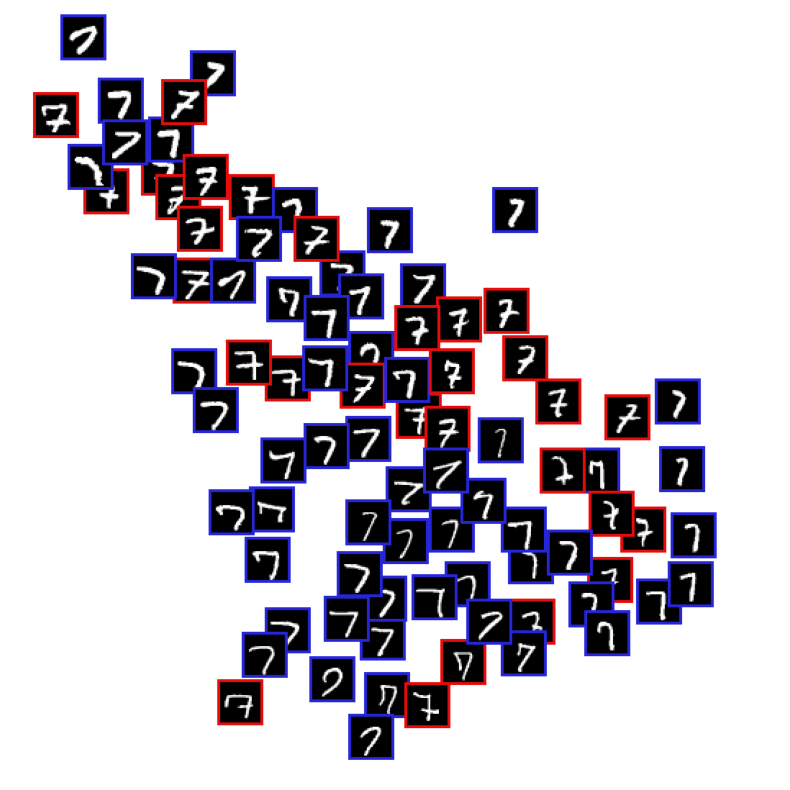

499
529
GM balanced accuracy score with hand-crafted labels :  0.5963112648559783
GM ari with hand-crafted labels :  0.03236565804495962
GM vm with hand-crafted labels :  0.02017107155279534
Epoch: 7 	Training Loss: 15.663869


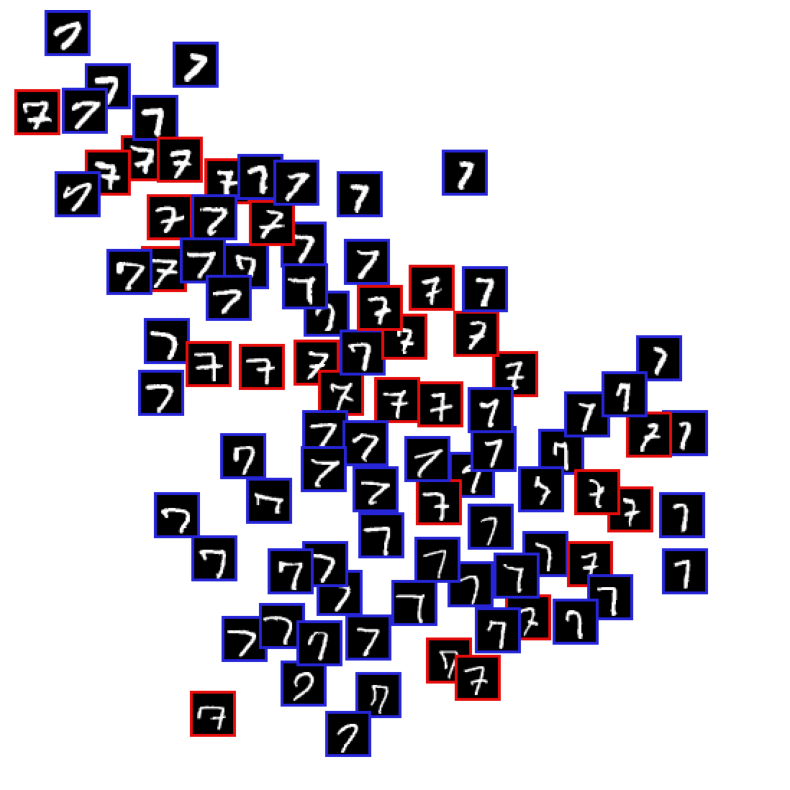

497
531
GM balanced accuracy score with hand-crafted labels :  0.5944788848169333
GM ari with hand-crafted labels :  0.03353192409276759
GM vm with hand-crafted labels :  0.01937985925485741
Epoch: 8 	Training Loss: 14.371232


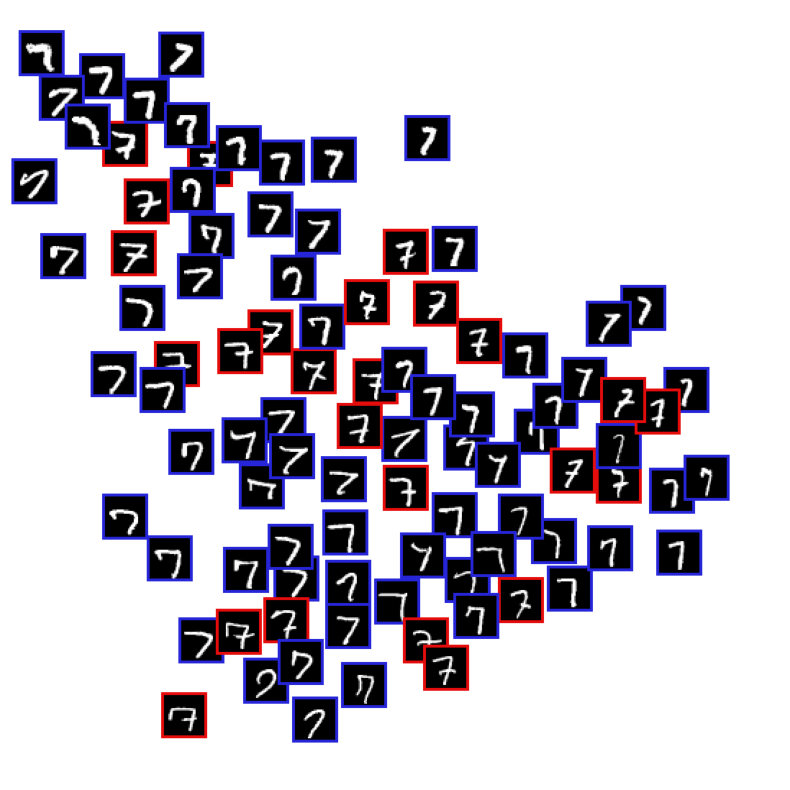

496
532
GM balanced accuracy score with hand-crafted labels :  0.599633523992191
GM ari with hand-crafted labels :  0.03581143421051474
GM vm with hand-crafted labels :  0.021771461829478728
Epoch: 9 	Training Loss: 13.875054


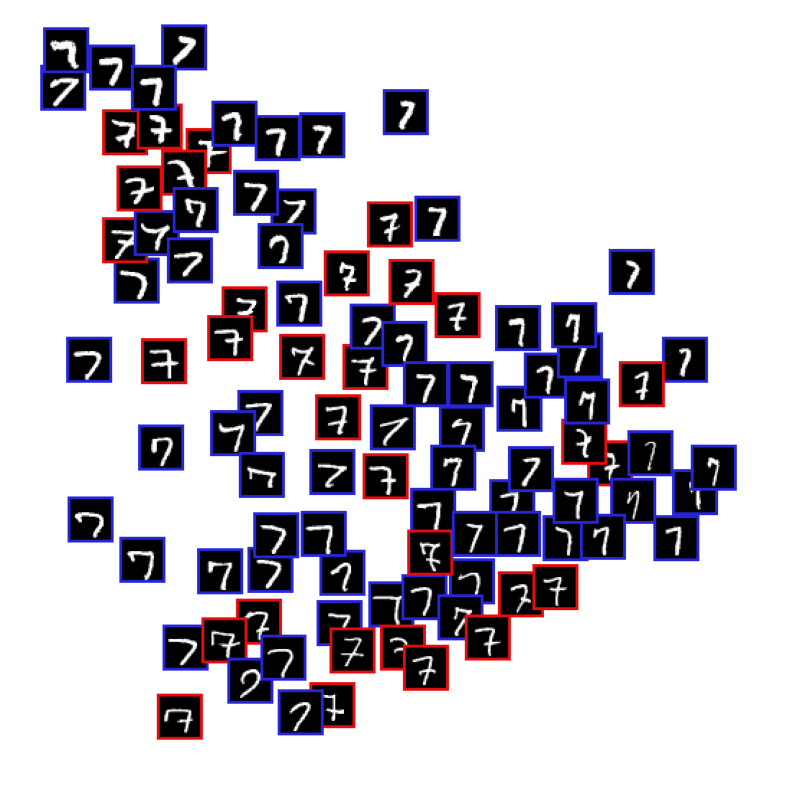

498
530
GM balanced accuracy score with hand-crafted labels :  0.5979723944240847
GM ari with hand-crafted labels :  0.034069115735722466
GM vm with hand-crafted labels :  0.02096329918397867
Epoch: 10 	Training Loss: 12.958479


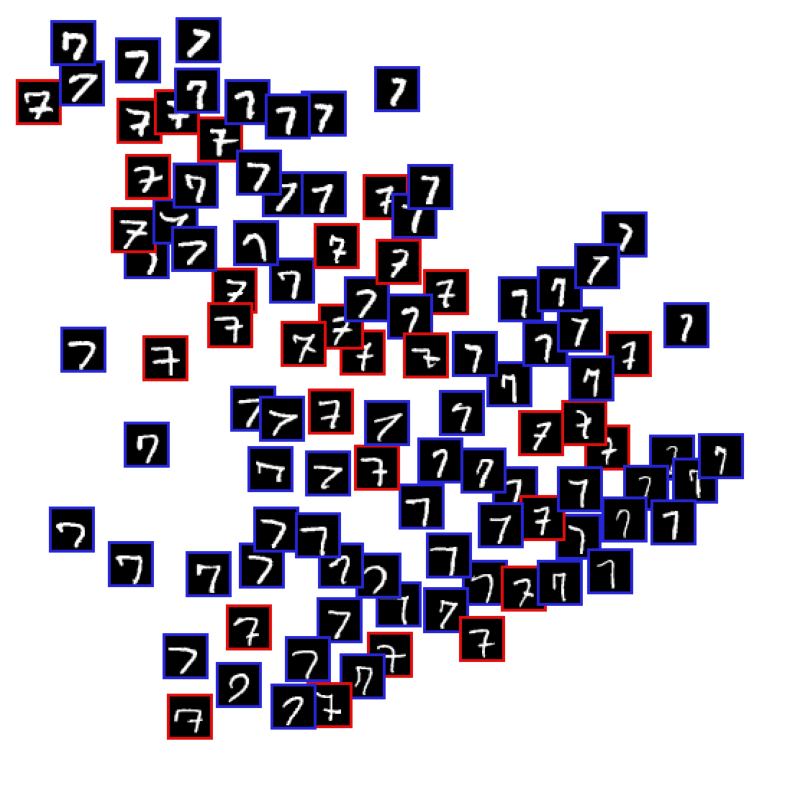

497
531
GM balanced accuracy score with hand-crafted labels :  0.5911566256807206
GM ari with hand-crafted labels :  0.03021350926491968
GM vm with hand-crafted labels :  0.017862262981363362
Epoch: 11 	Training Loss: 12.357611


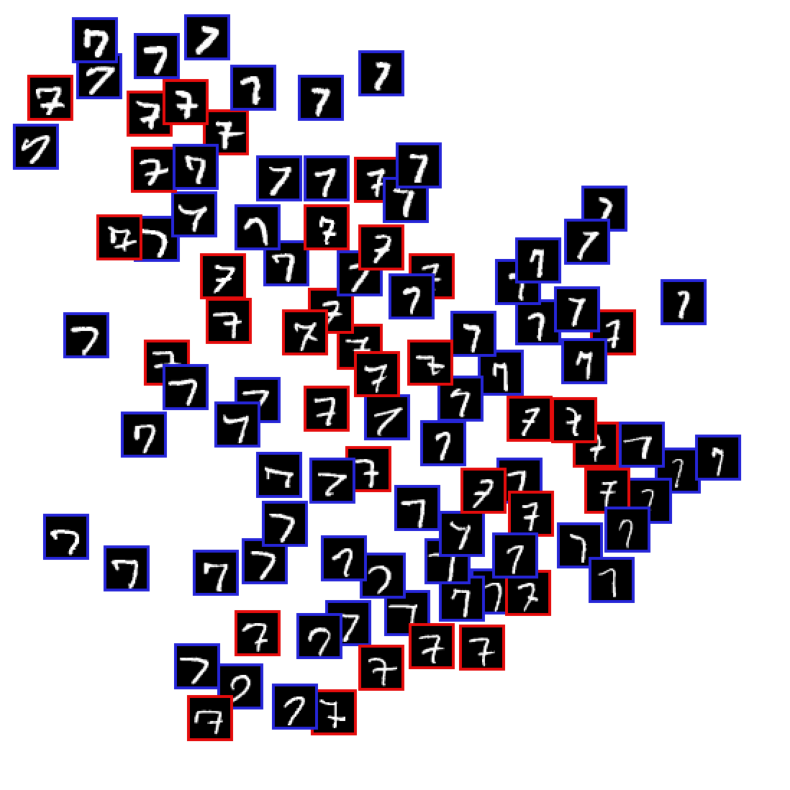

501
527
GM balanced accuracy score with hand-crafted labels :  0.601465904031236
GM ari with hand-crafted labels :  0.03455463195666537
GM vm with hand-crafted labels :  0.022610998723690705
Epoch: 12 	Training Loss: 12.311143


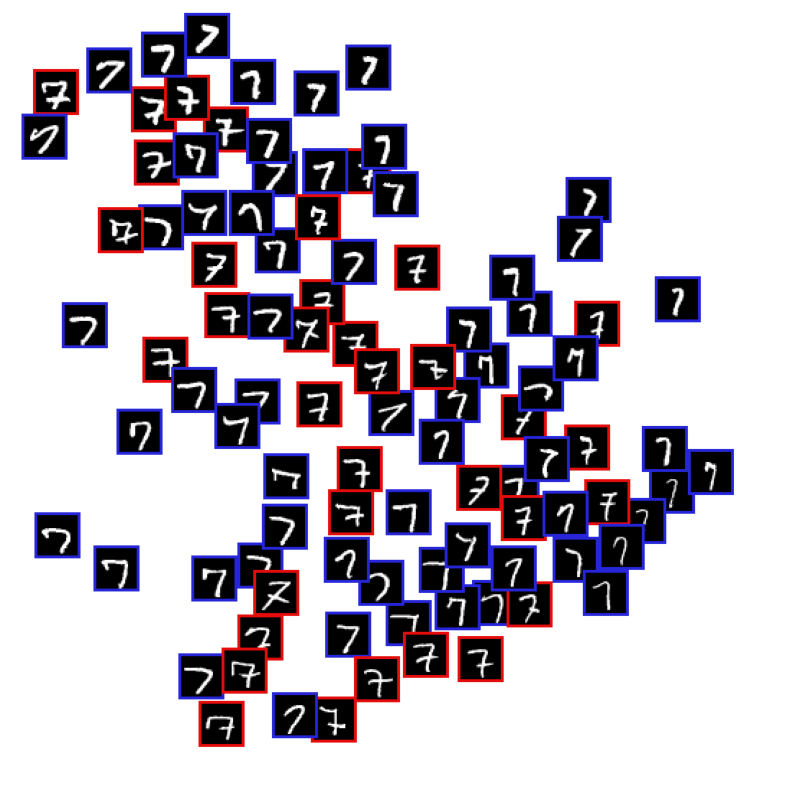

503
525
GM balanced accuracy score with hand-crafted labels :  0.5998047744631297
GM ari with hand-crafted labels :  0.032826325308311914
GM vm with hand-crafted labels :  0.021793360354128287
Epoch: 13 	Training Loss: 12.133535


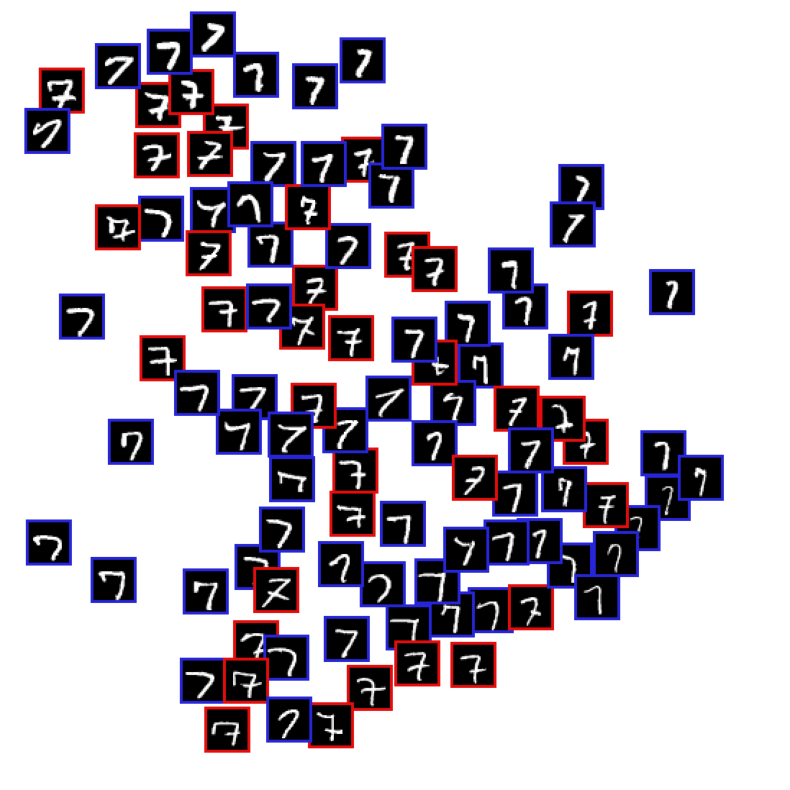

505
523
GM balanced accuracy score with hand-crafted labels :  0.6032982840702812
GM ari with hand-crafted labels :  0.03323543924750972
GM vm with hand-crafted labels :  0.023481962524431382
Epoch: 14 	Training Loss: 11.745668


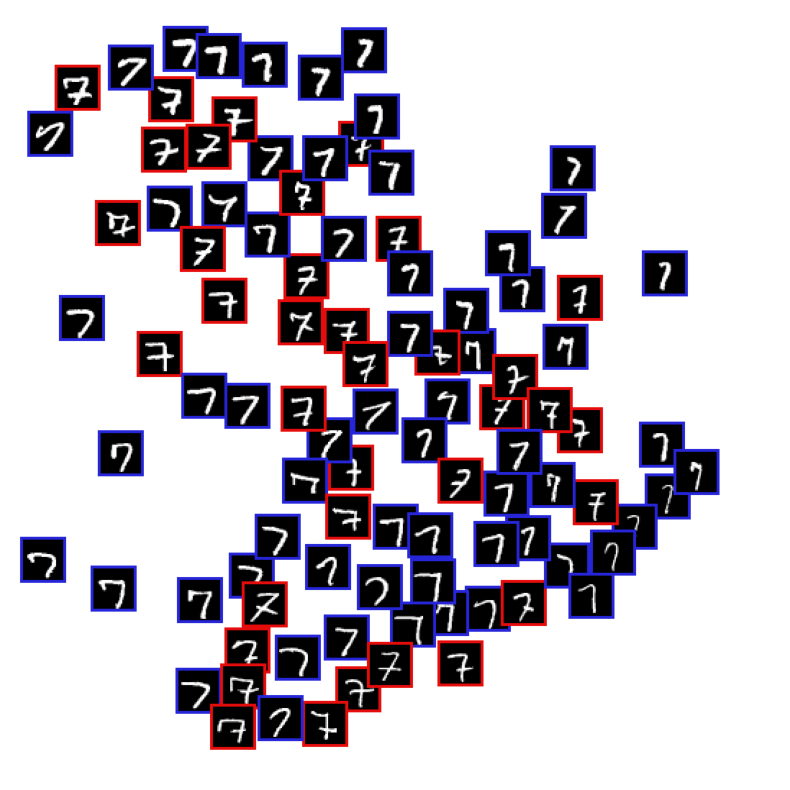

502
526
GM balanced accuracy score with hand-crafted labels :  0.6082816727746001
GM ari with hand-crafted labels :  0.03861112509970459
GM vm with hand-crafted labels :  0.026058254883790922
Epoch: 15 	Training Loss: 11.668300


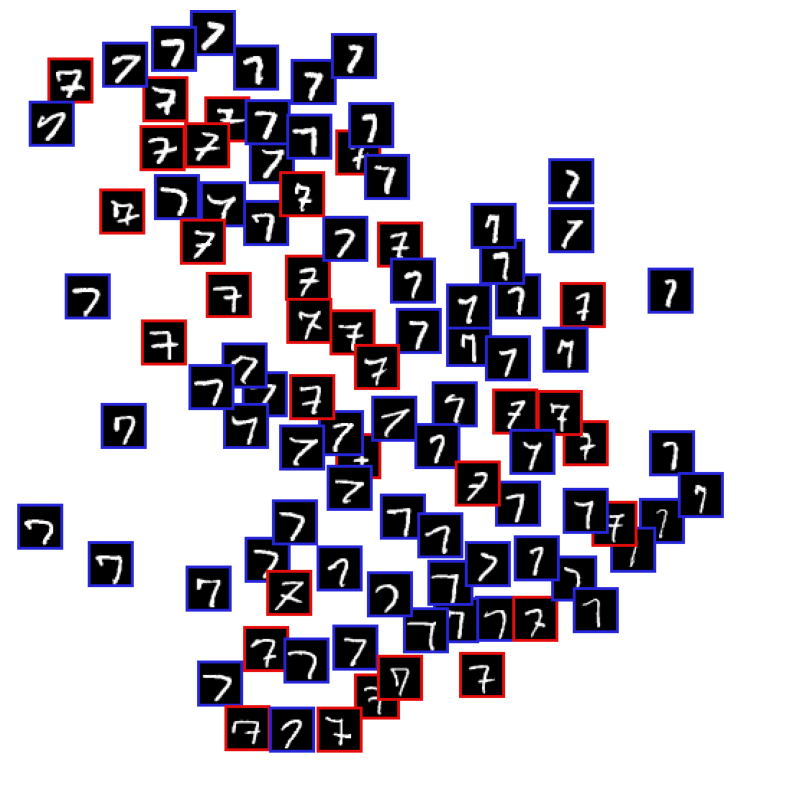

513
515
GM balanced accuracy score with hand-crafted labels :  0.6051306641093264
GM ari with hand-crafted labels :  0.03185350791325678
GM vm with hand-crafted labels :  0.024386271051020526
Epoch: 16 	Training Loss: 11.353763


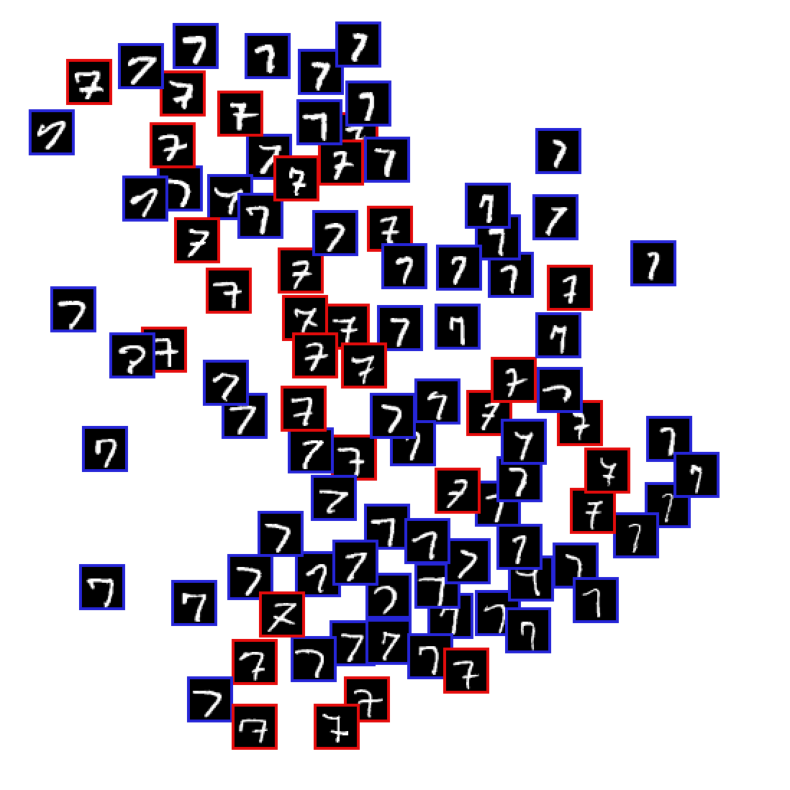

505
523
GM balanced accuracy score with hand-crafted labels :  0.6117751823817515
GM ari with hand-crafted labels :  0.03904329730540328
GM vm with hand-crafted labels :  0.027890759921369863
Epoch: 17 	Training Loss: 11.541013


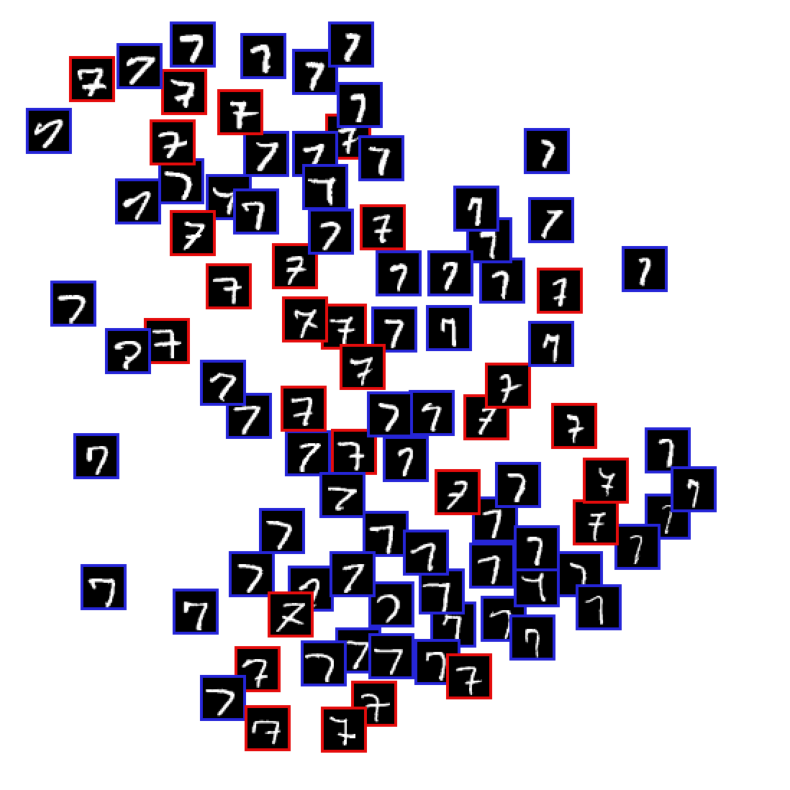

512
516
GM balanced accuracy score with hand-crafted labels :  0.6051306641093264
GM ari with hand-crafted labels :  0.03185350791325678
GM vm with hand-crafted labels :  0.024386271051020526
Epoch: 18 	Training Loss: 10.685756


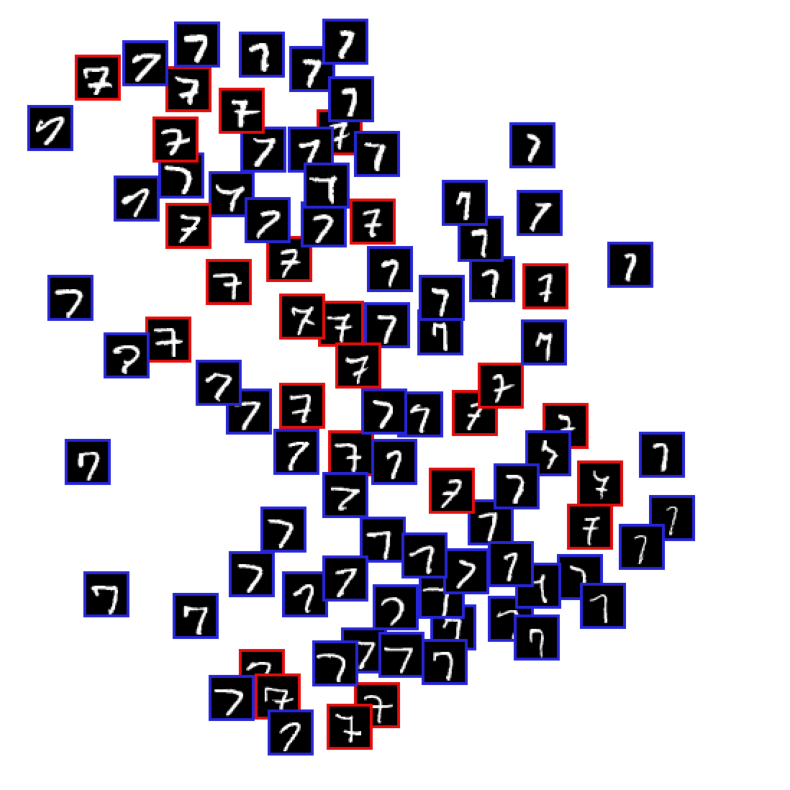

511
517
GM balanced accuracy score with hand-crafted labels :  0.6067917936774326
GM ari with hand-crafted labels :  0.03359313013103713
GM vm with hand-crafted labels :  0.025239021988561122
Epoch: 19 	Training Loss: 11.063928


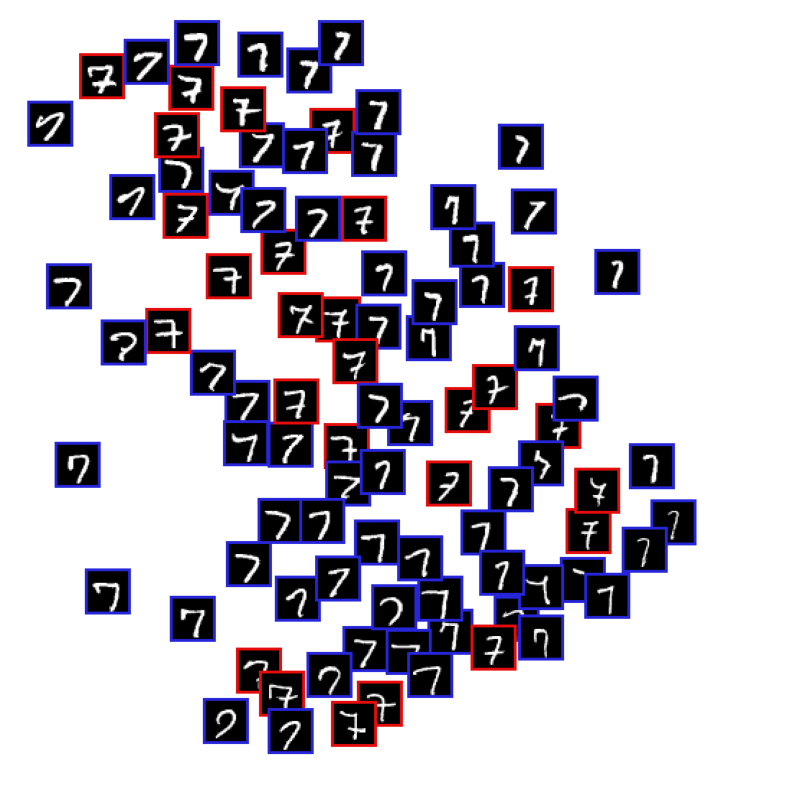

512
516
GM balanced accuracy score with hand-crafted labels :  0.6119464328526903
GM ari with hand-crafted labels :  0.035702594196924516
GM vm with hand-crafted labels :  0.02796028605248097
Epoch: 20 	Training Loss: 10.742536


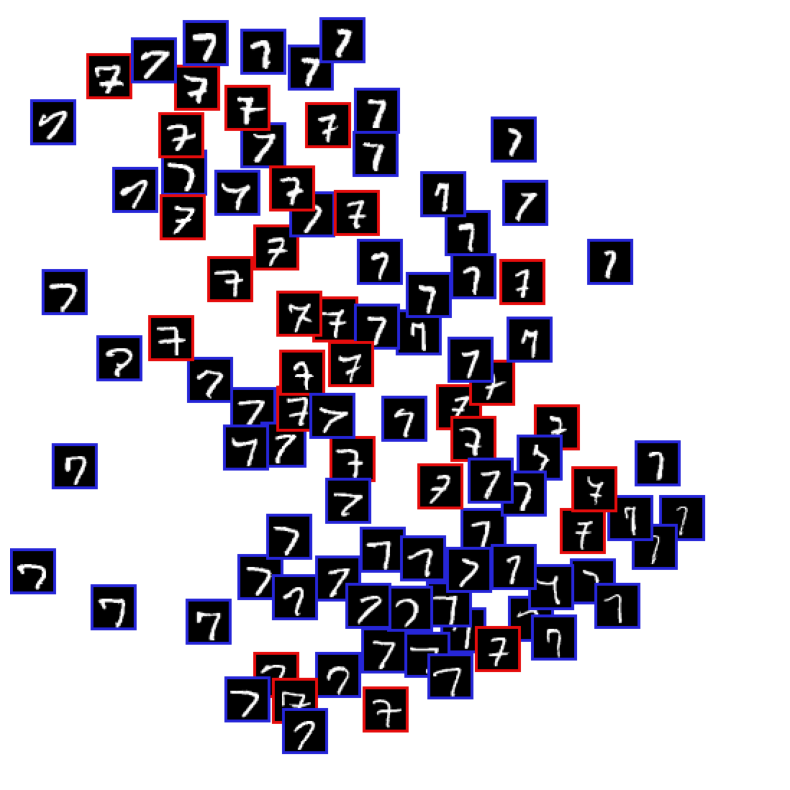

510
518
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 21 	Training Loss: 10.797455


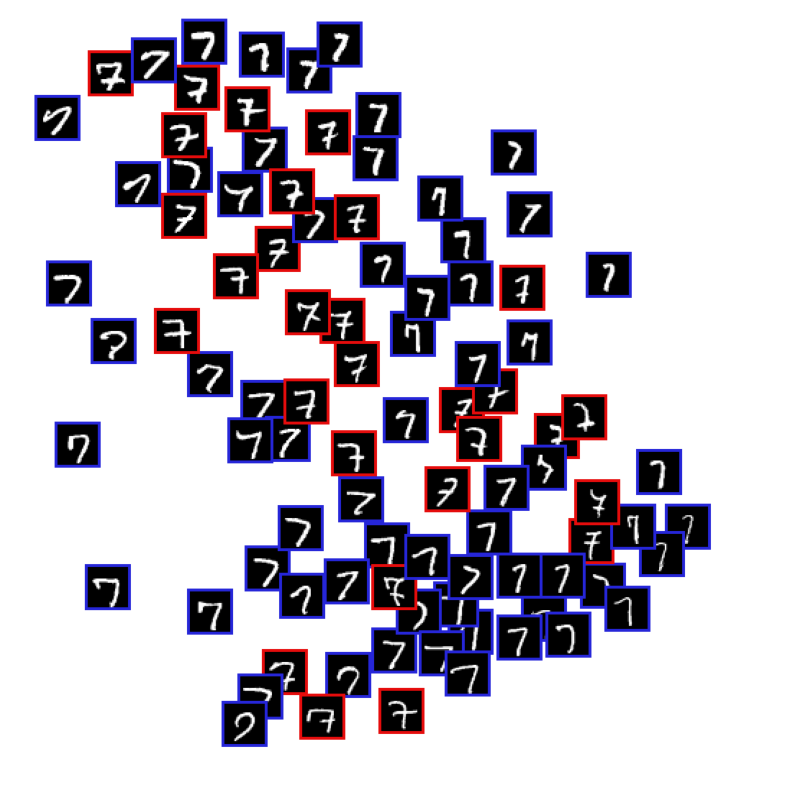

515
513
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 22 	Training Loss: 10.948405


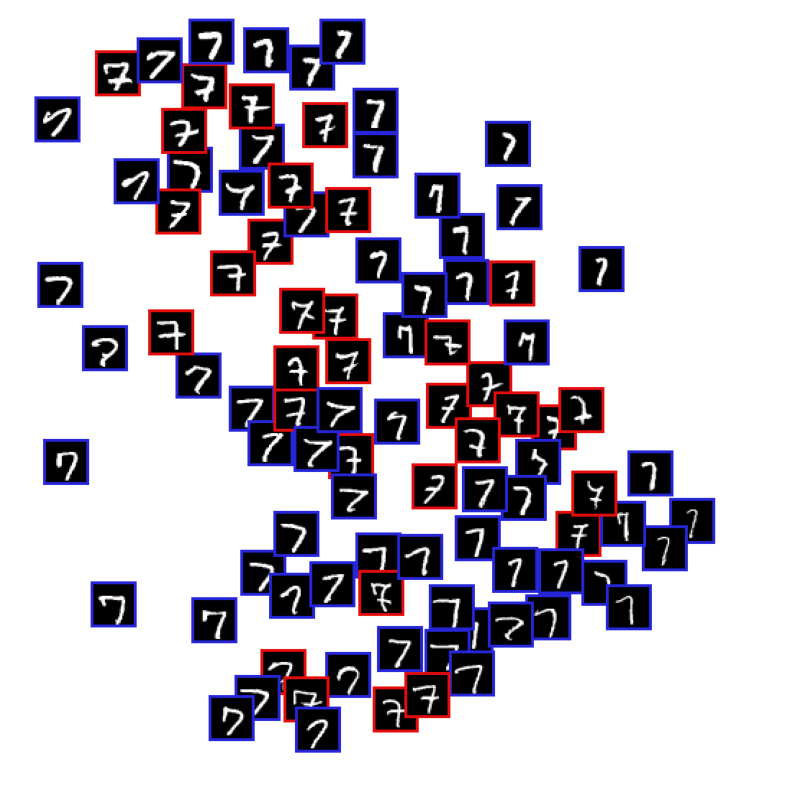

510
518
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 23 	Training Loss: 11.001475


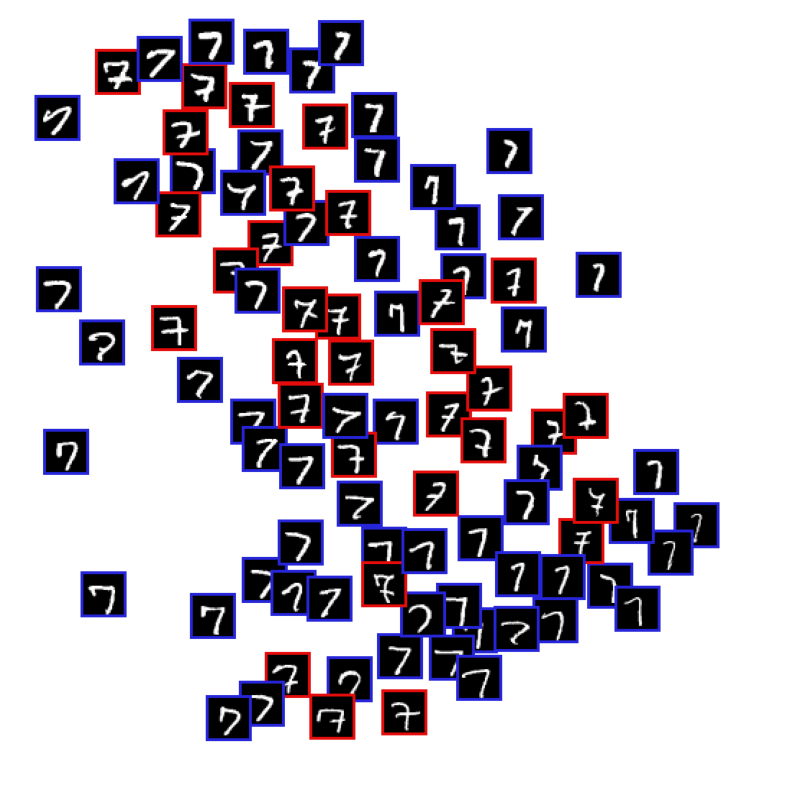

512
516
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 24 	Training Loss: 11.133627


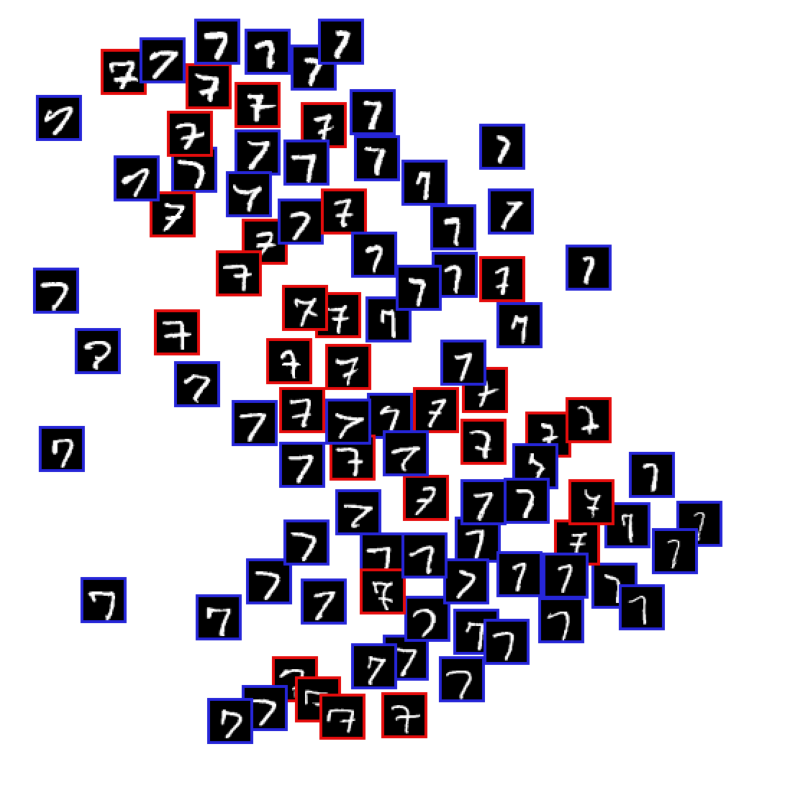

512
516
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 25 	Training Loss: 11.151344


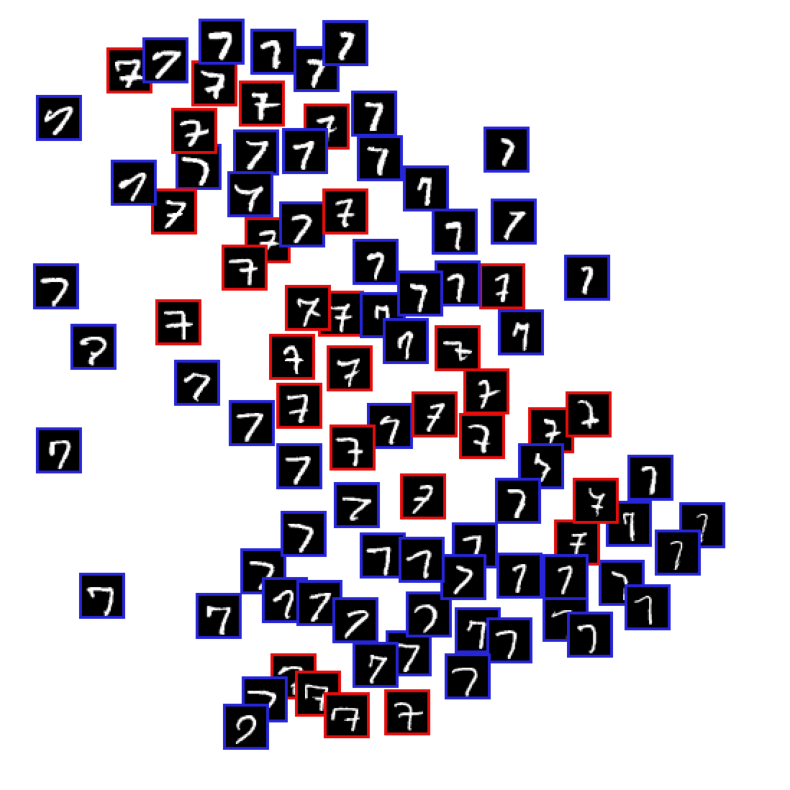

513
515
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 26 	Training Loss: 10.199659


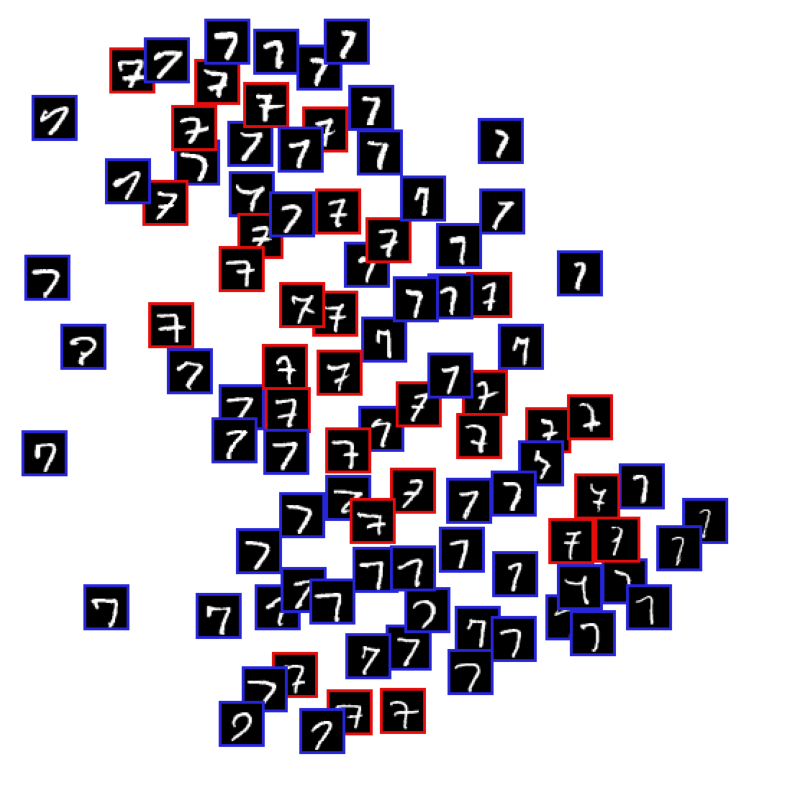

512
516
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 27 	Training Loss: 10.761372


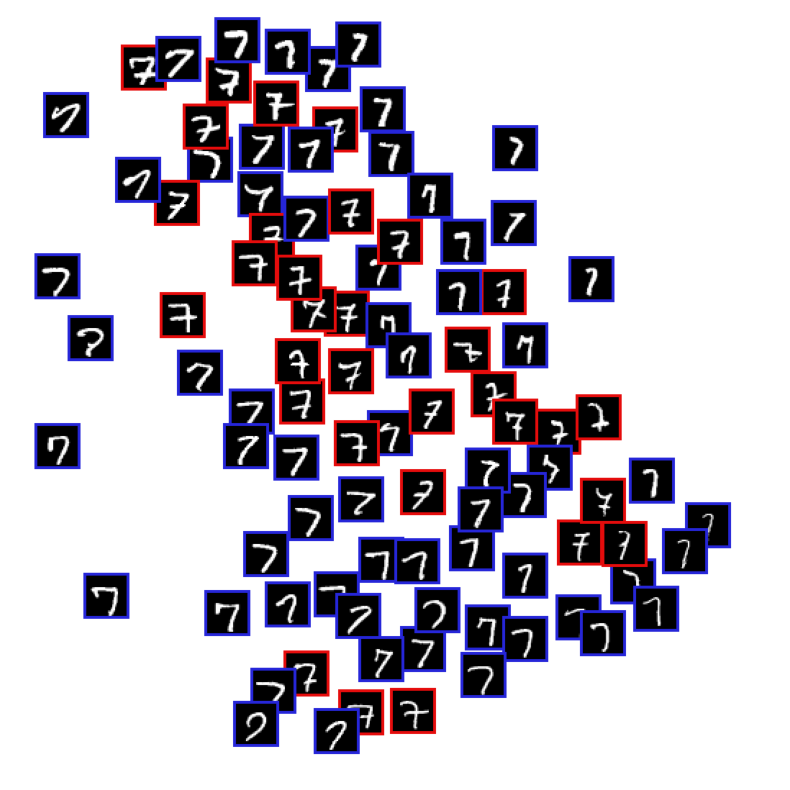

511
517
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 28 	Training Loss: 10.735386


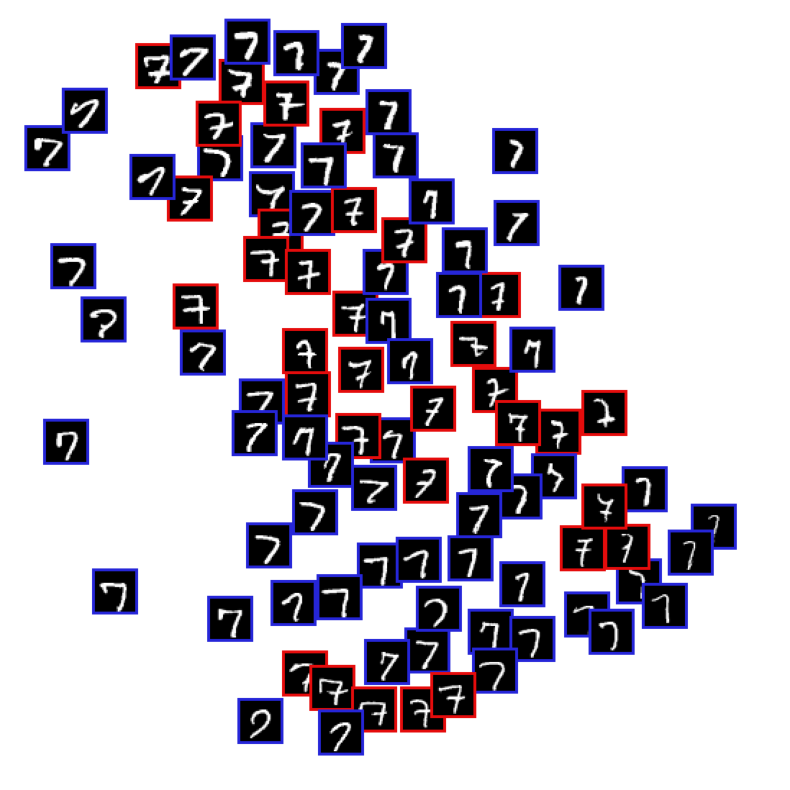

516
512
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 29 	Training Loss: 10.960628


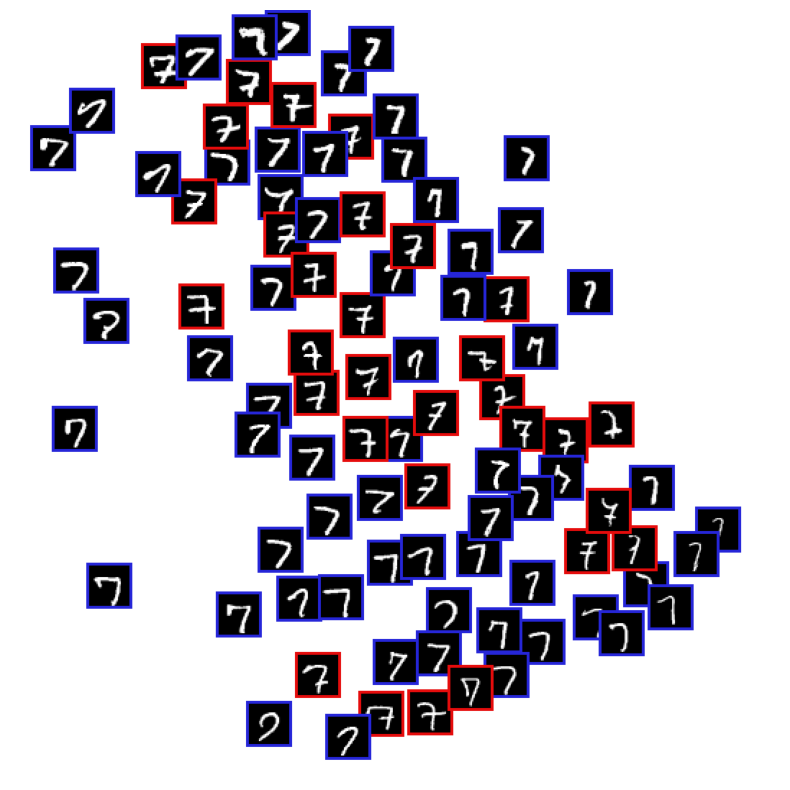

516
512
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 30 	Training Loss: 9.853310


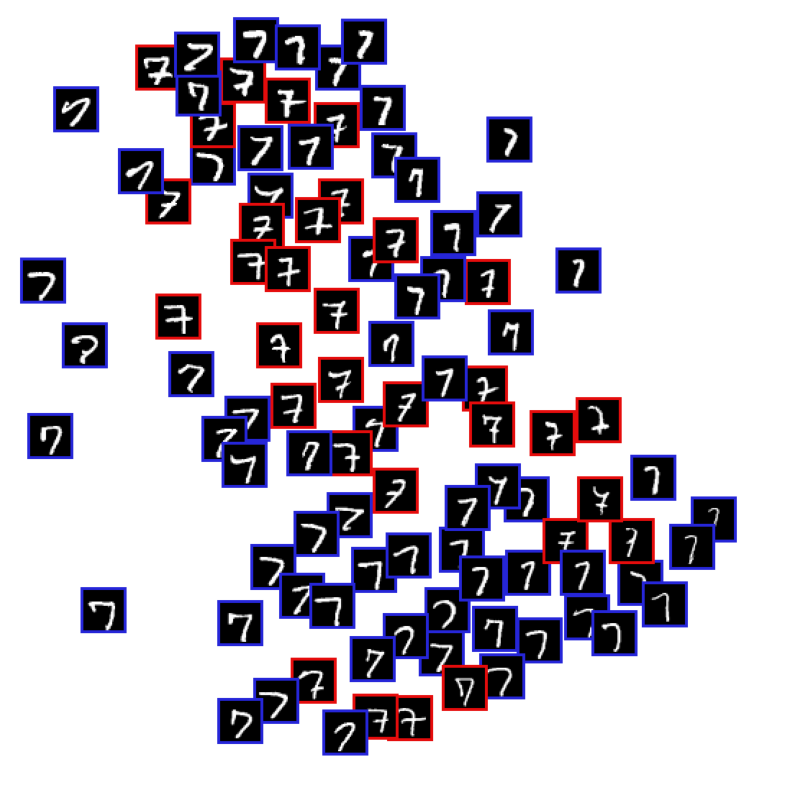

510
518
GM balanced accuracy score with hand-crafted labels :  0.6084529232455389
GM ari with hand-crafted labels :  0.035371241168695604
GM vm with hand-crafted labels :  0.026107239922023986
Epoch: 31 	Training Loss: 10.948558


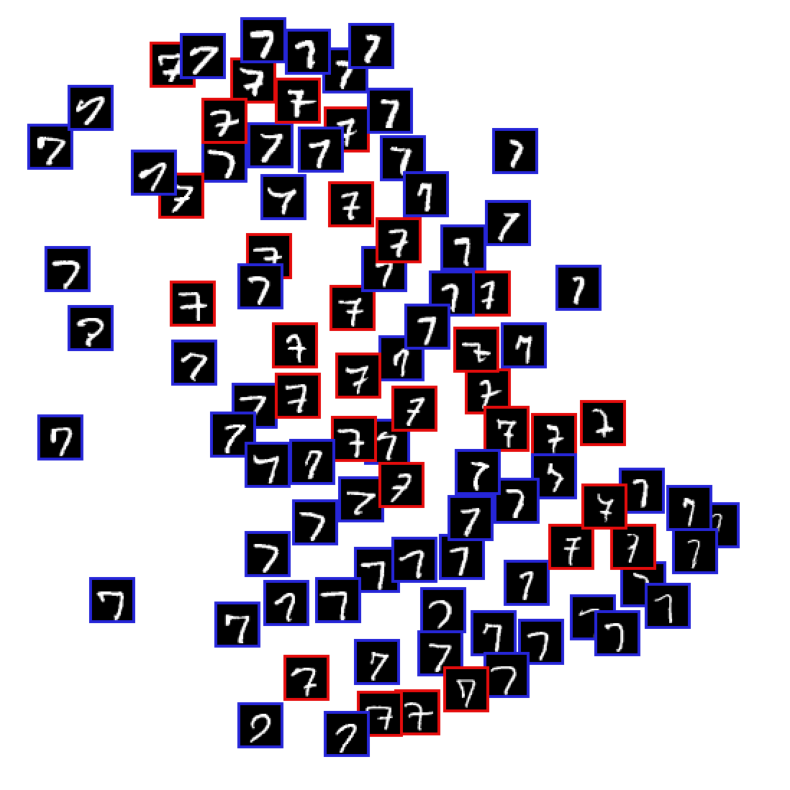

513
515
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 32 	Training Loss: 10.507377


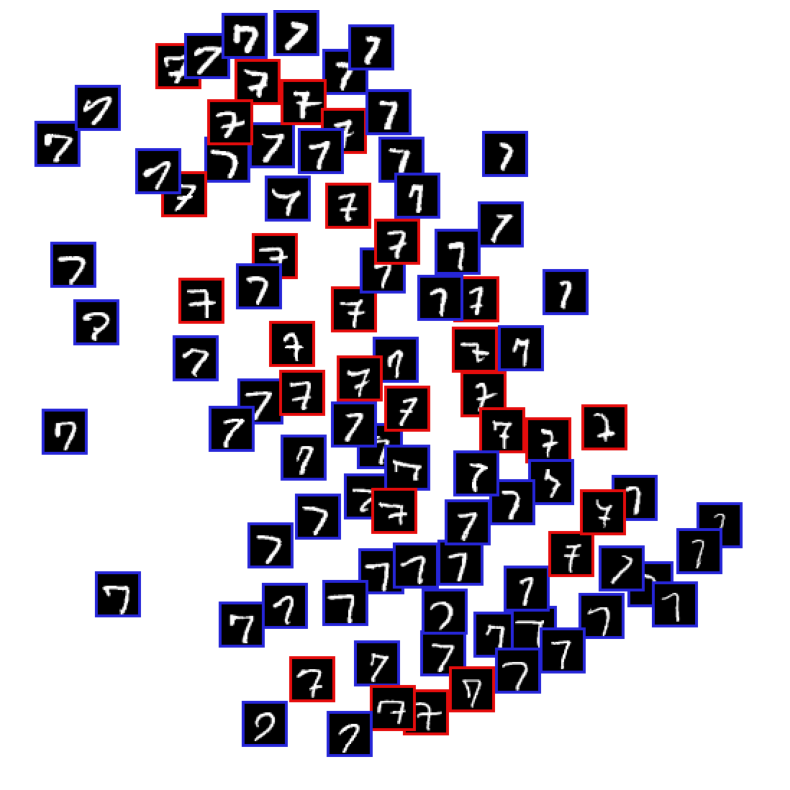

517
511
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 33 	Training Loss: 10.442865


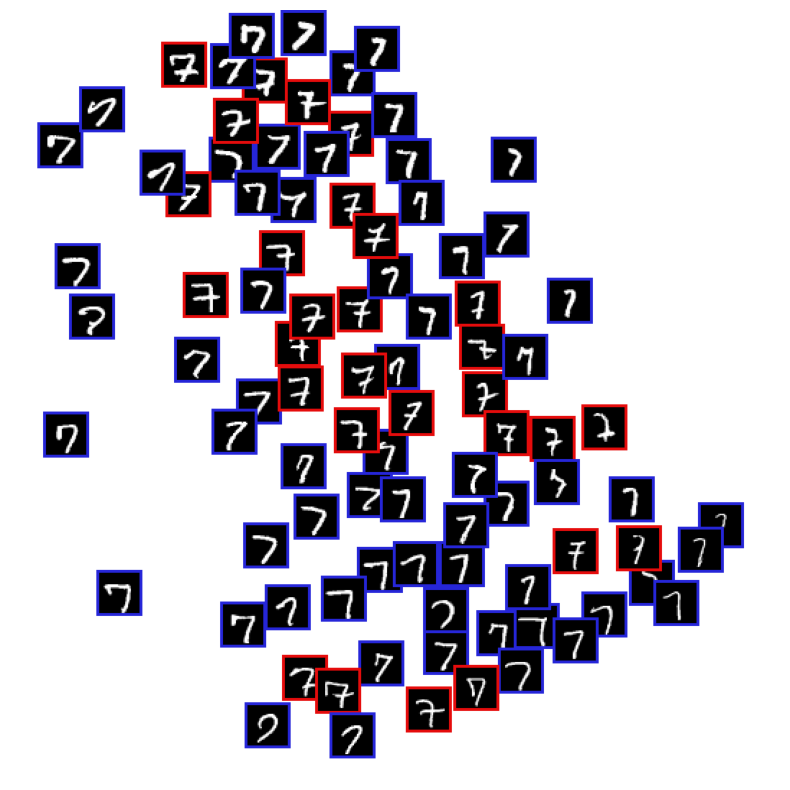

517
511
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 34 	Training Loss: 10.523143


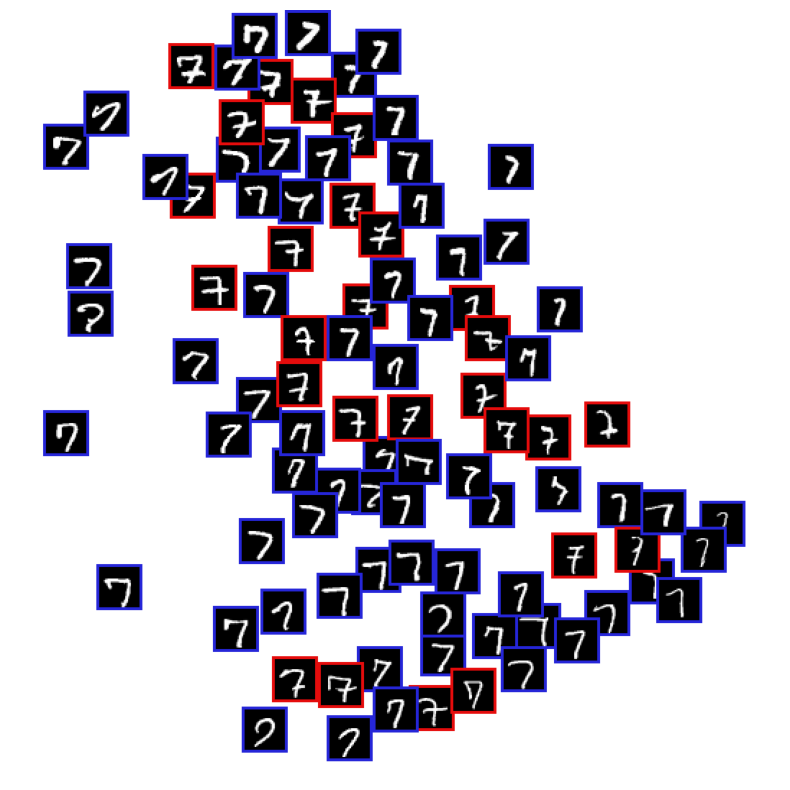

521
507
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 35 	Training Loss: 10.613437


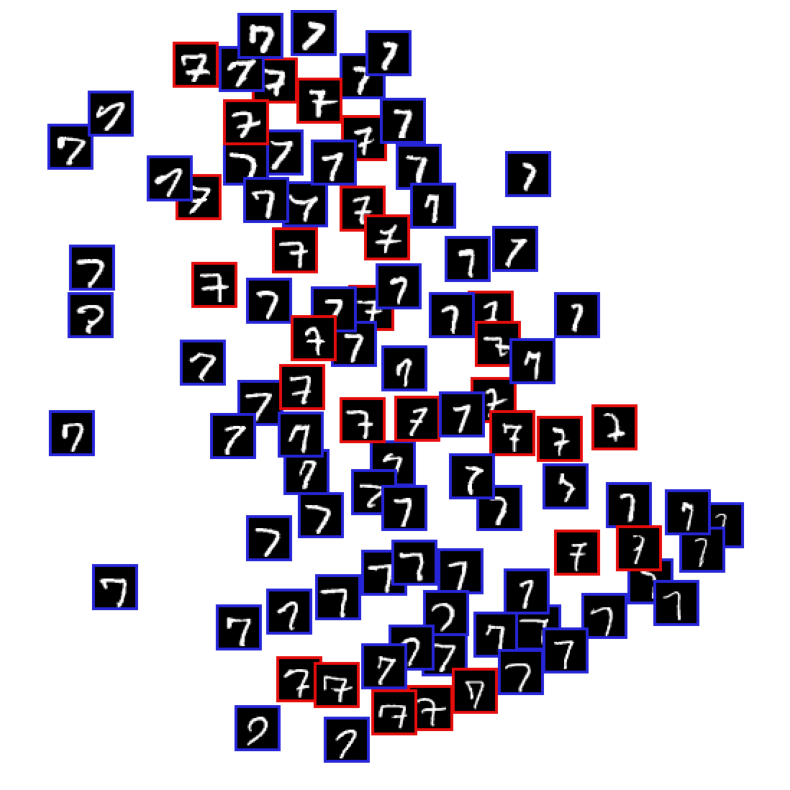

518
510
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 36 	Training Loss: 10.400011


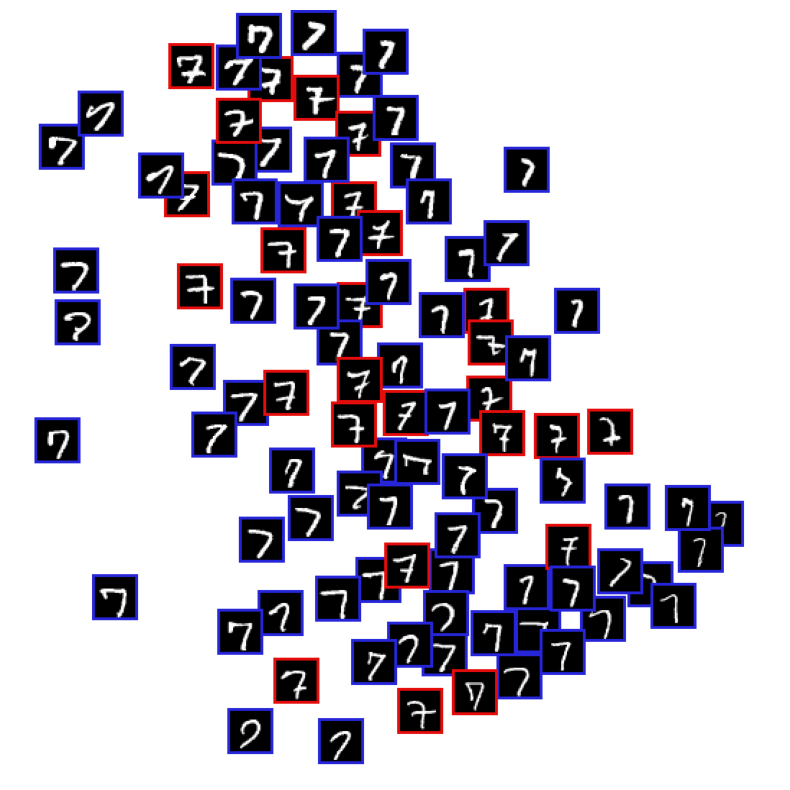

517
511
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 37 	Training Loss: 10.067343


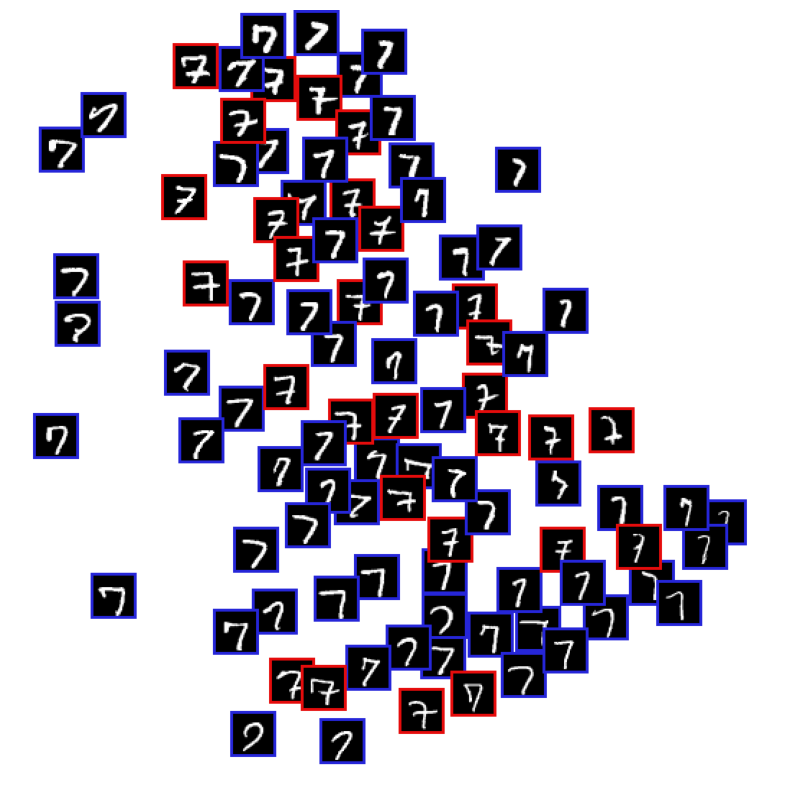

518
510
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 38 	Training Loss: 10.921005


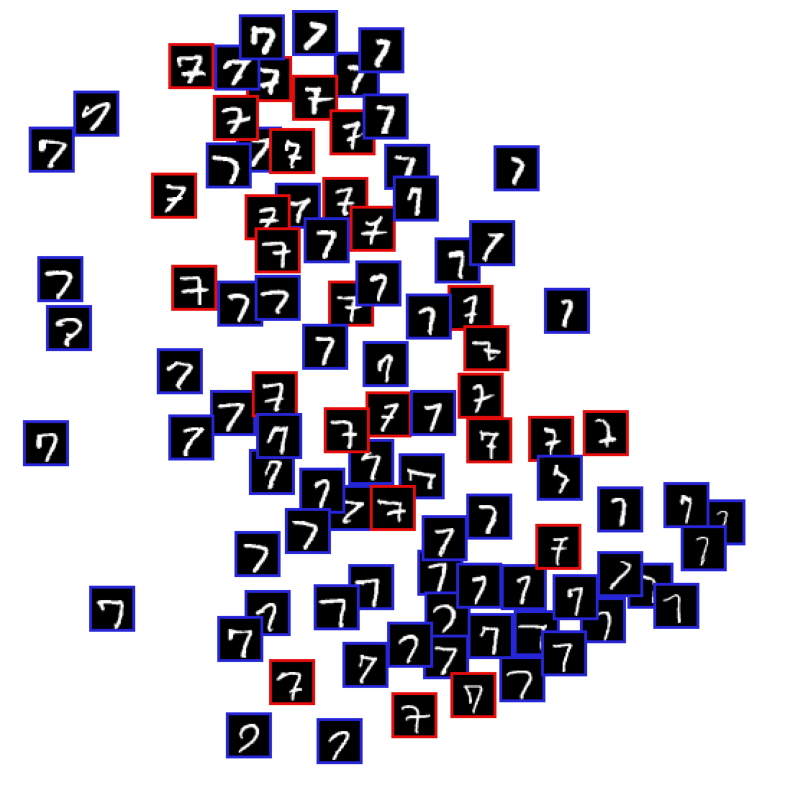

512
516
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 39 	Training Loss: 9.739225


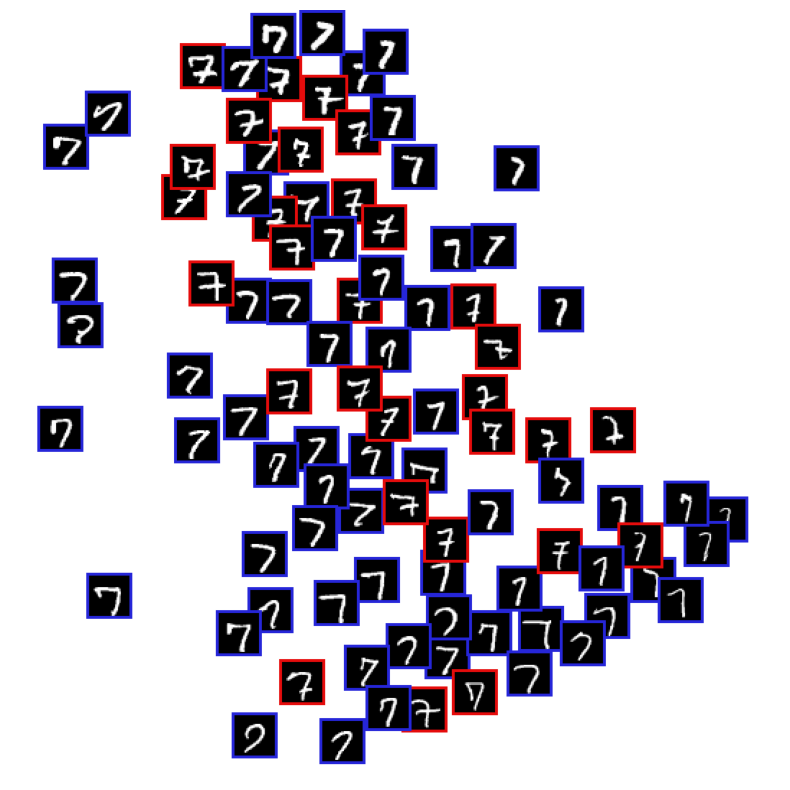

517
511
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 40 	Training Loss: 10.946892


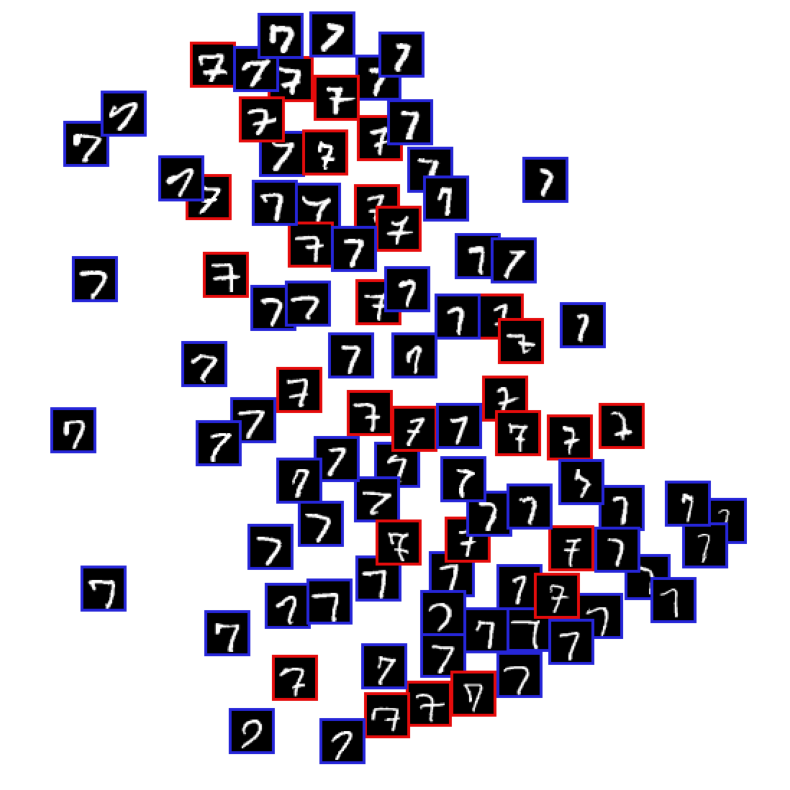

517
511
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 41 	Training Loss: 9.891734


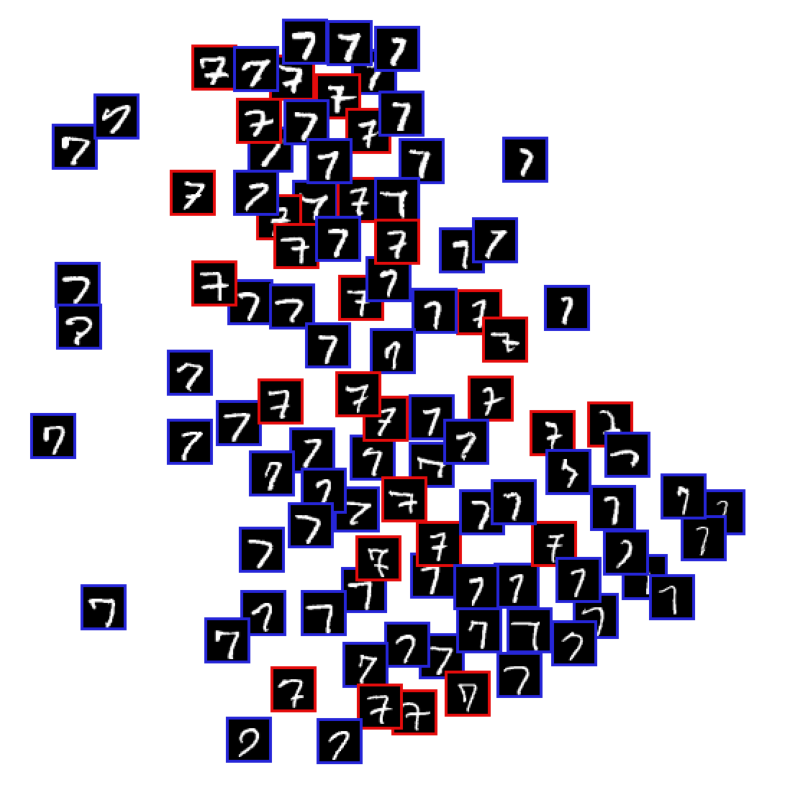

512
516
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 42 	Training Loss: 10.298017


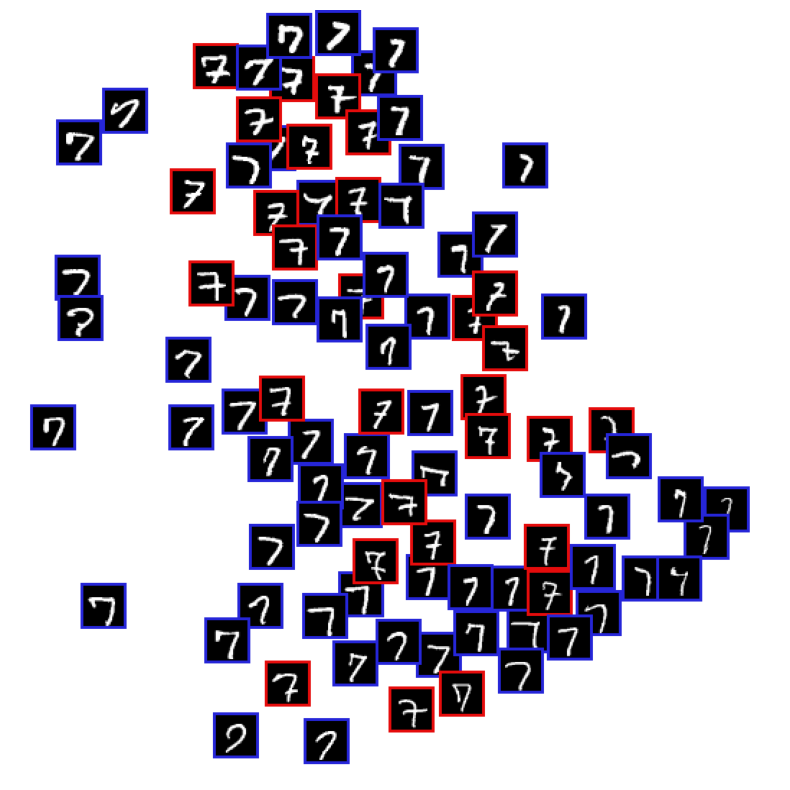

517
511
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 43 	Training Loss: 9.955472


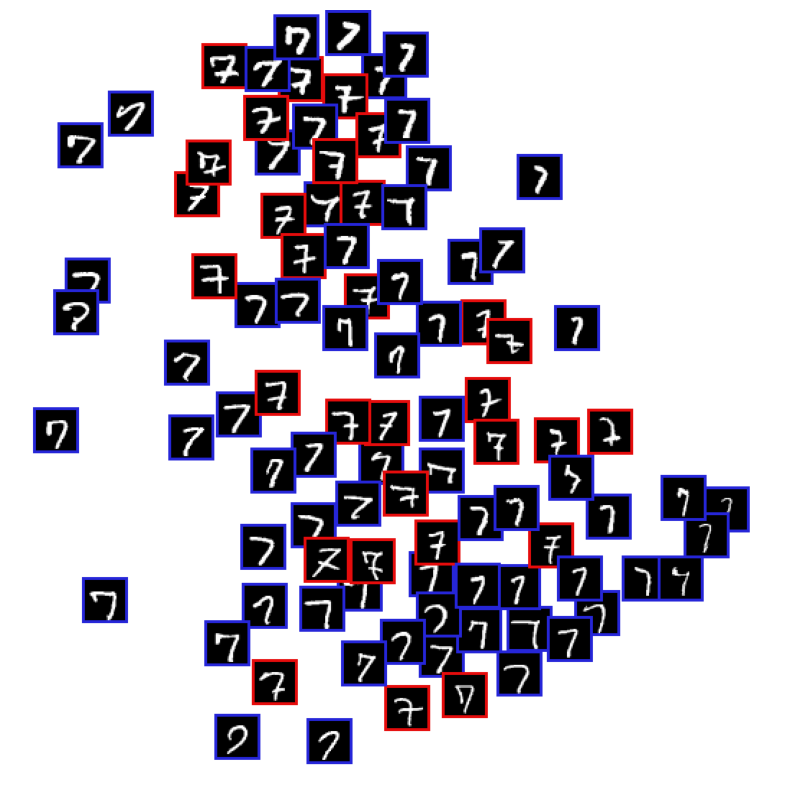

516
512
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 44 	Training Loss: 9.772846


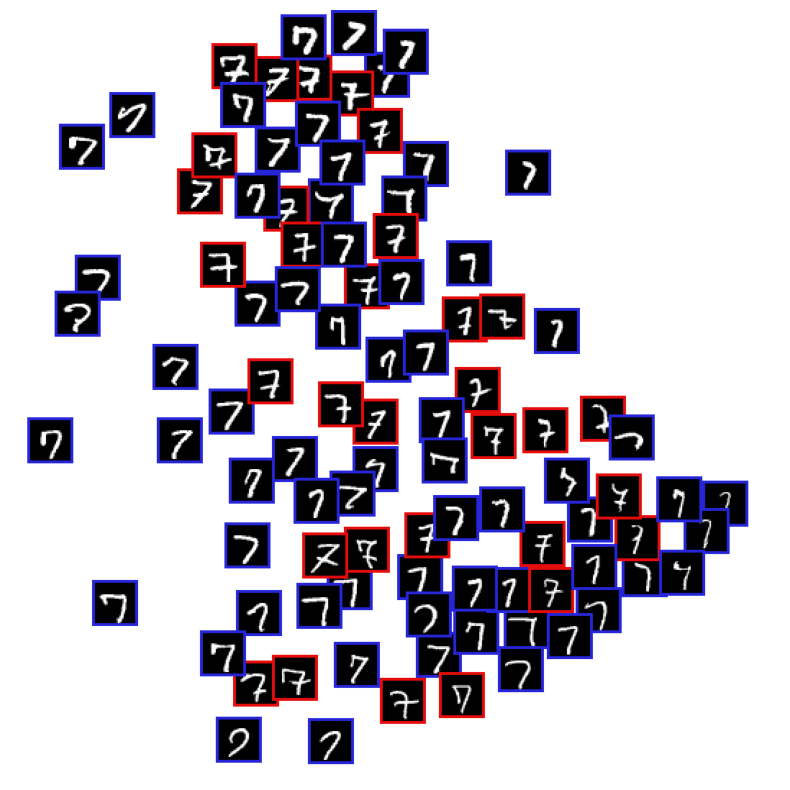

518
510
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 45 	Training Loss: 10.445229


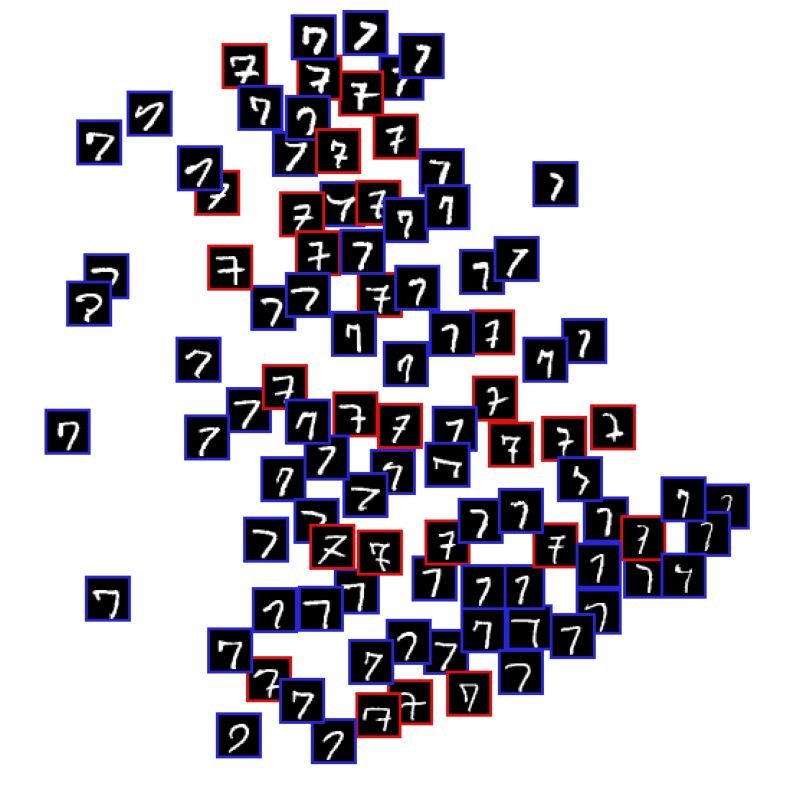

512
516
GM balanced accuracy score with hand-crafted labels :  0.6119464328526903
GM ari with hand-crafted labels :  0.035702594196924516
GM vm with hand-crafted labels :  0.02796028605248097
Epoch: 46 	Training Loss: 10.226210


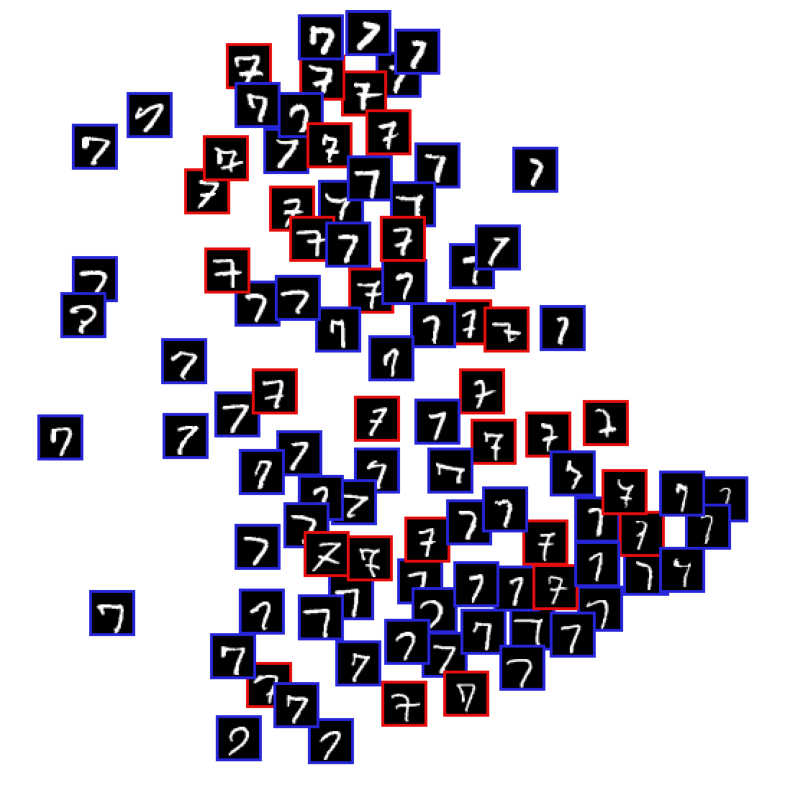

516
512
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 47 	Training Loss: 10.155744


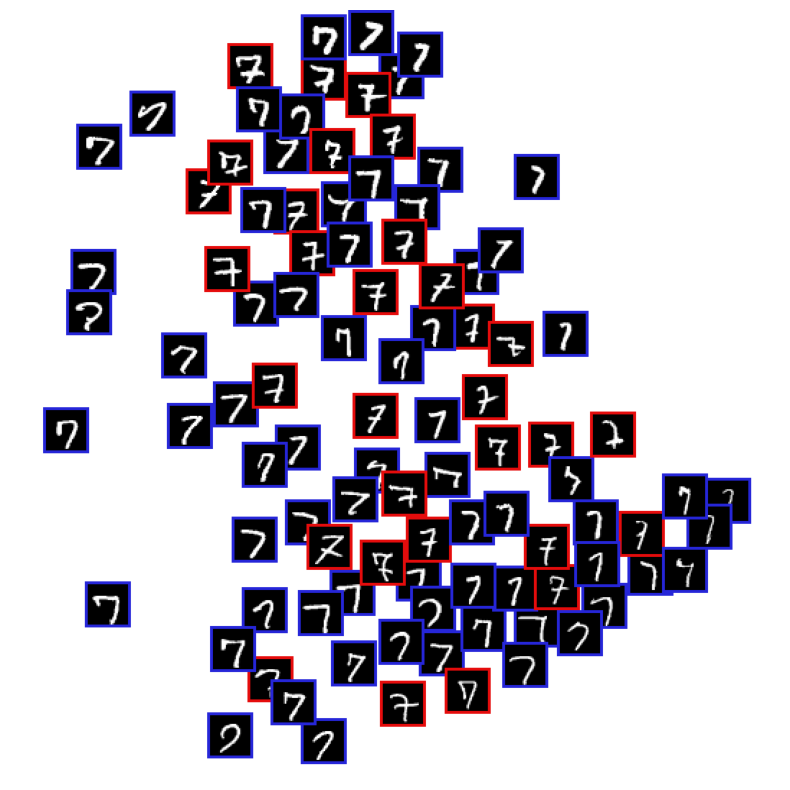

518
510
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 48 	Training Loss: 9.690588


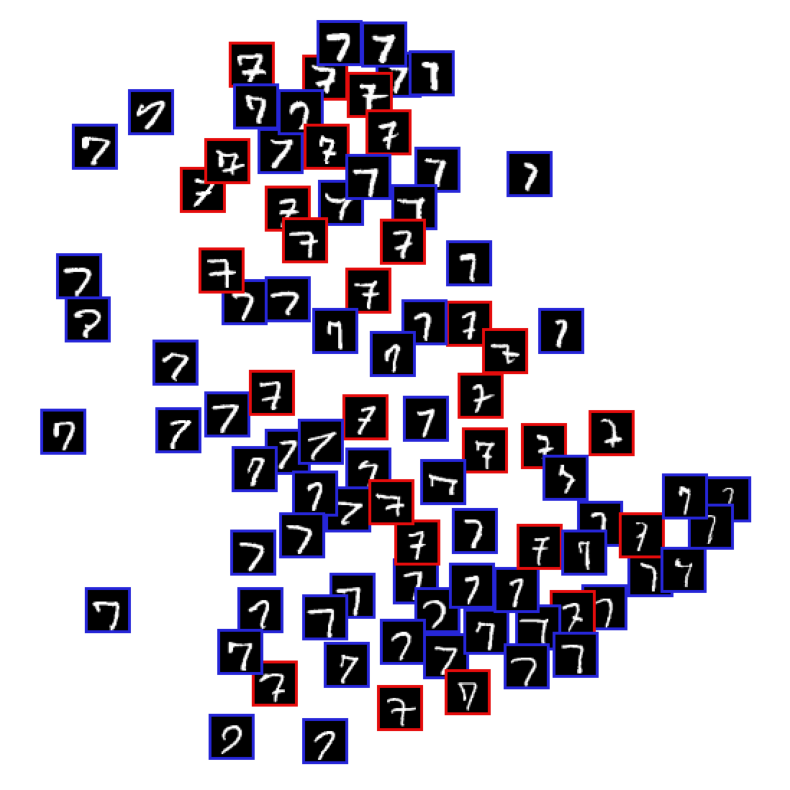

517
511
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 49 	Training Loss: 10.022846


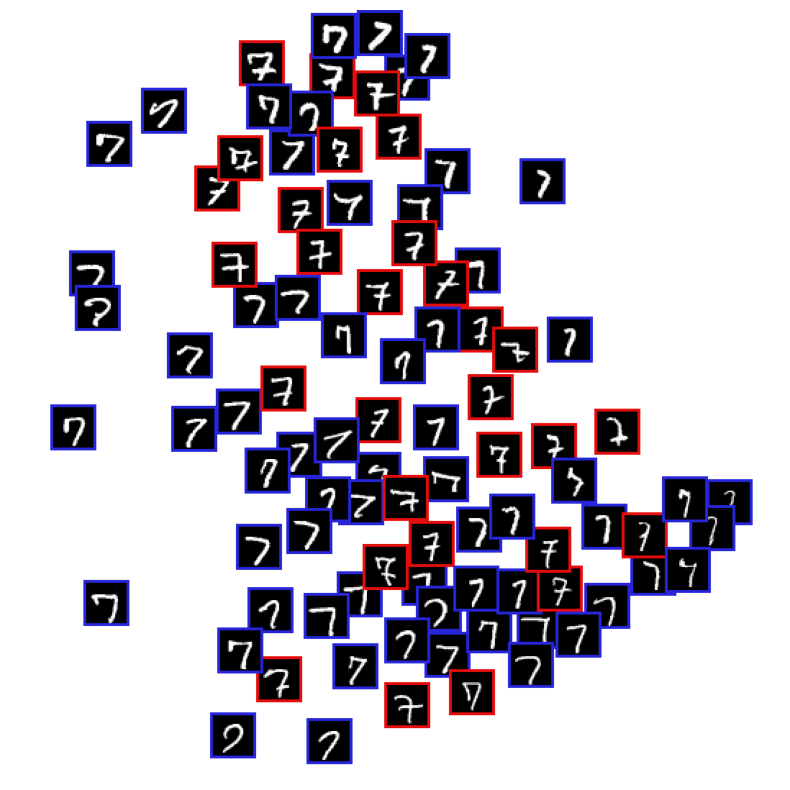

516
512
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 50 	Training Loss: 10.372301


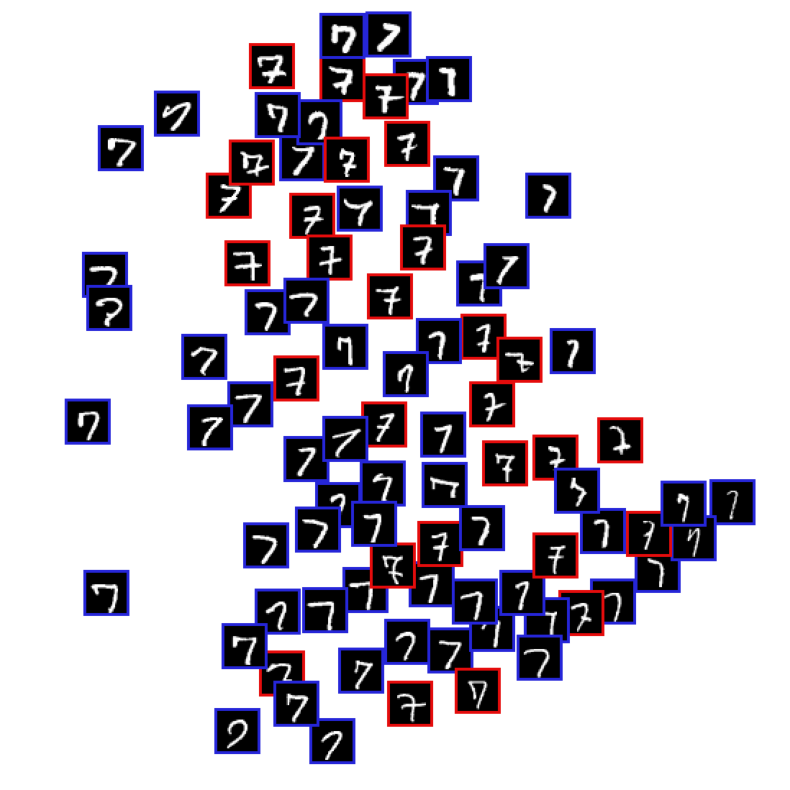

521
507
GM balanced accuracy score with hand-crafted labels :  0.6069630441483713
GM ari with hand-crafted labels :  0.030408445870778088
GM vm with hand-crafted labels :  0.025325988662826125
Epoch: 51 	Training Loss: 10.034168


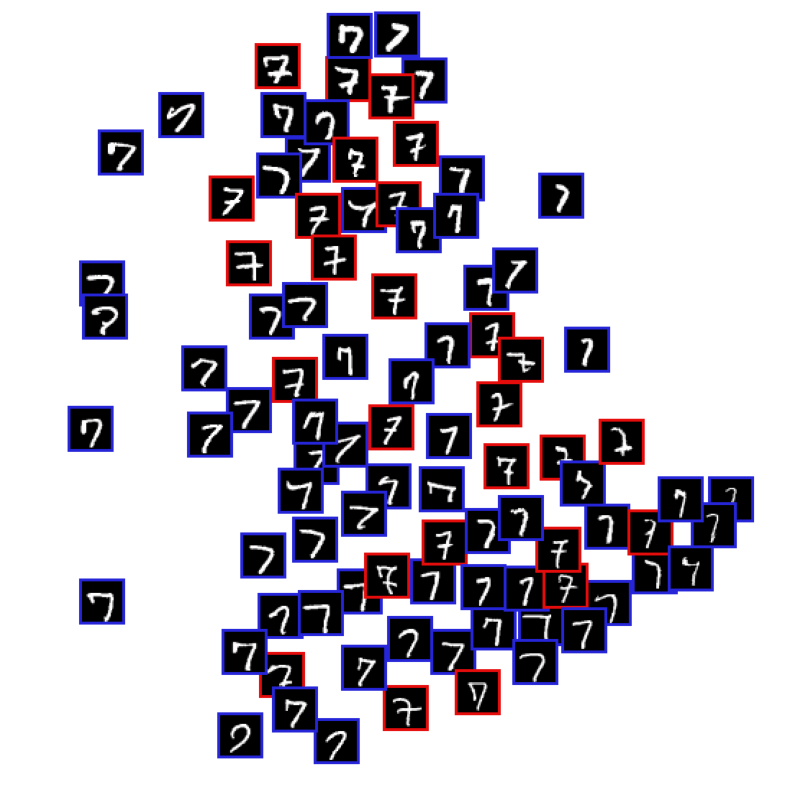

516
512
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 52 	Training Loss: 10.449917


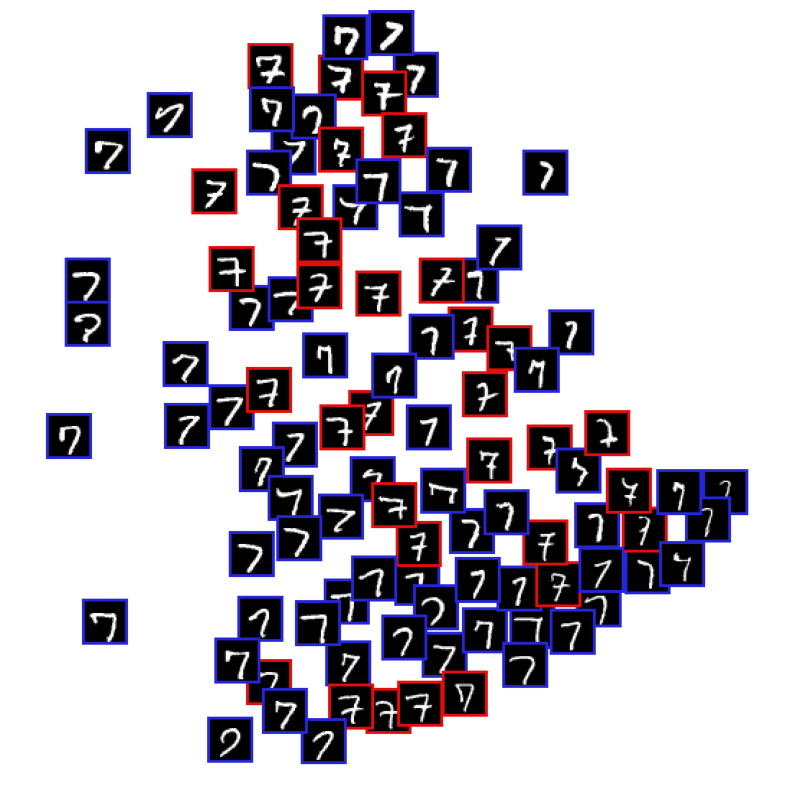

513
515
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 53 	Training Loss: 10.077516


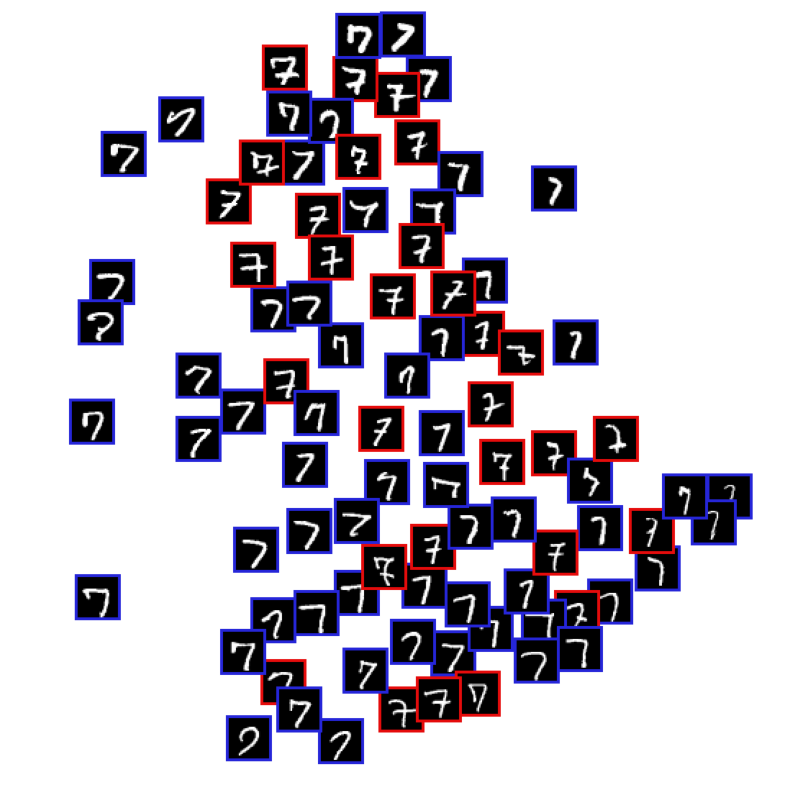

520
508
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 54 	Training Loss: 10.199974


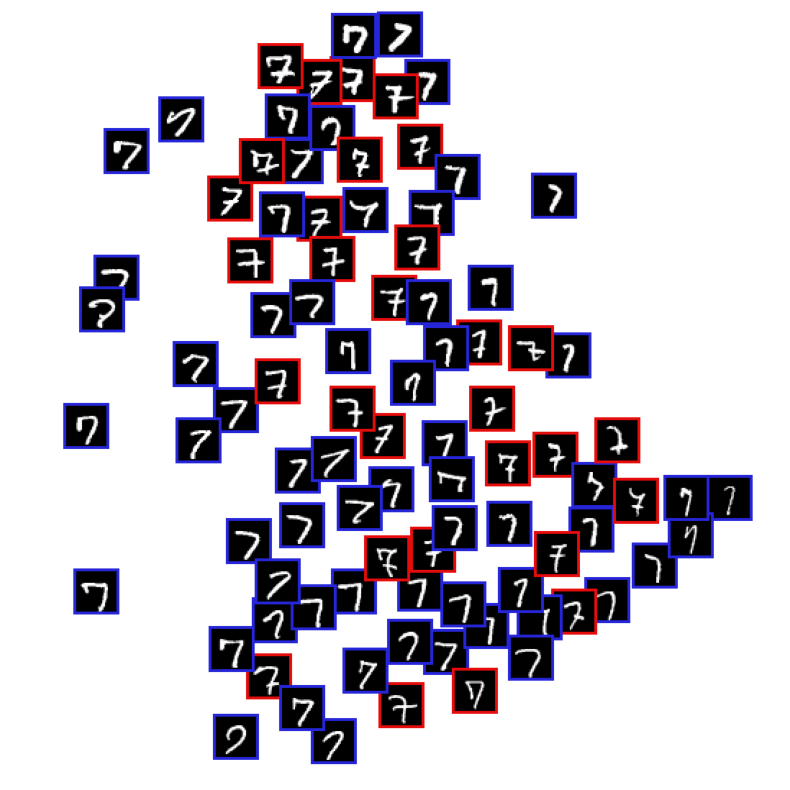

519
509
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 55 	Training Loss: 10.084369


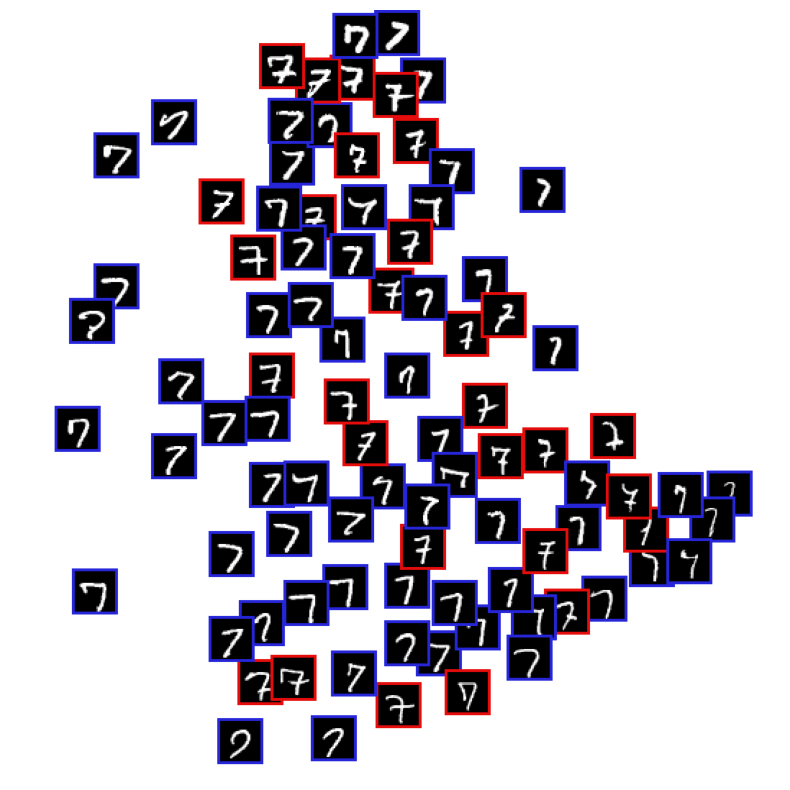

518
510
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 56 	Training Loss: 10.633427


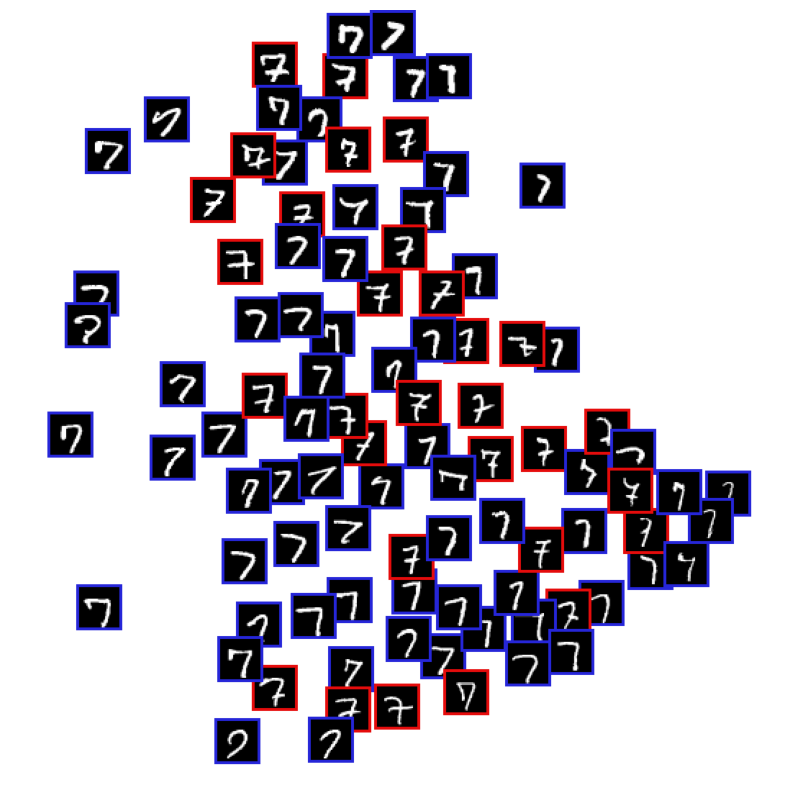

509
519
GM balanced accuracy score with hand-crafted labels :  0.6119464328526903
GM ari with hand-crafted labels :  0.035702594196924516
GM vm with hand-crafted labels :  0.02796028605248097
Epoch: 57 	Training Loss: 9.891231


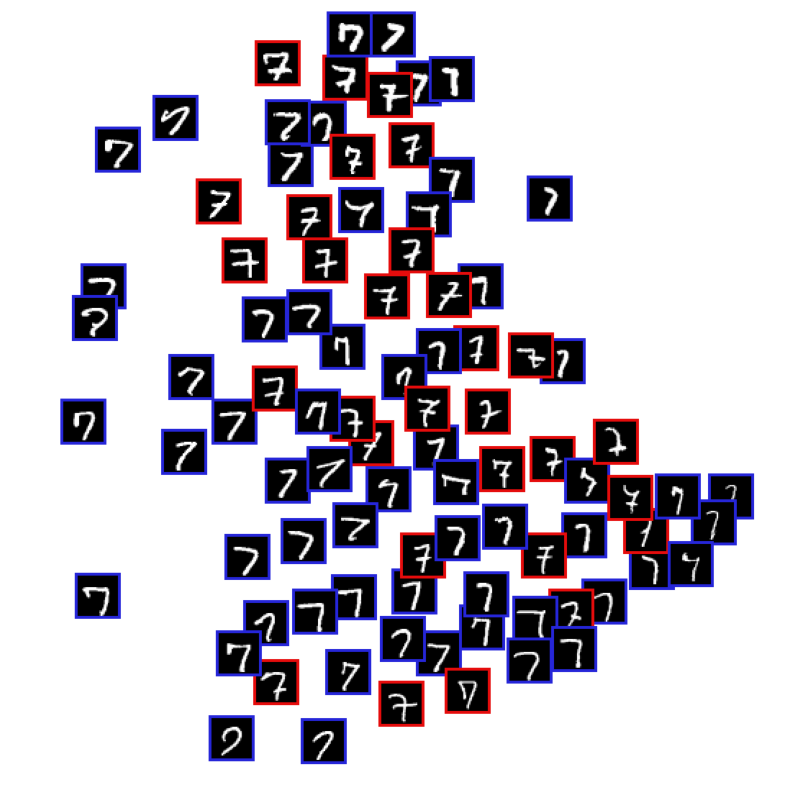

513
515
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 58 	Training Loss: 9.884750


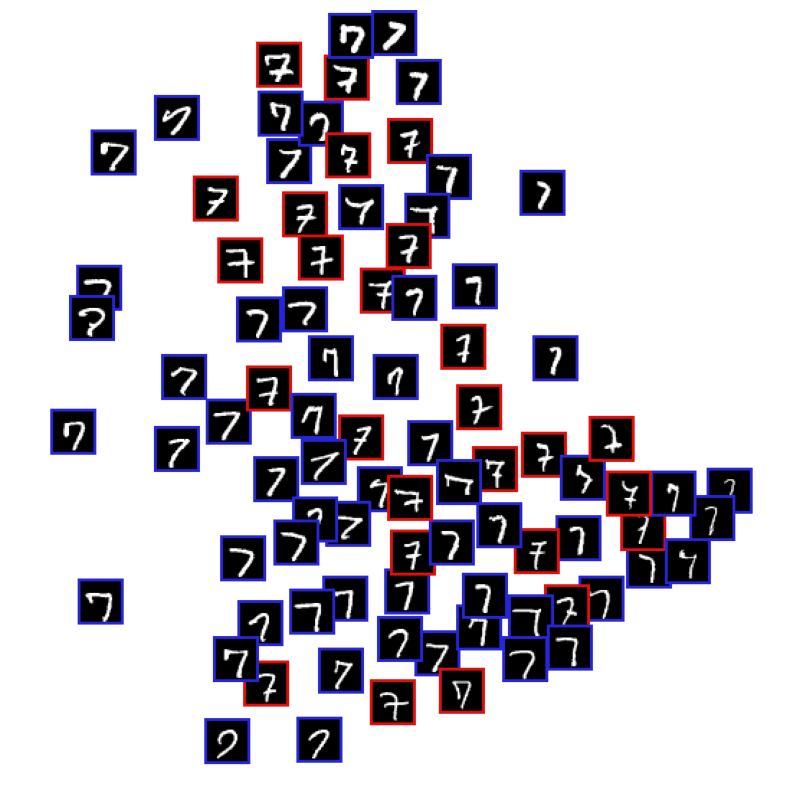

513
515
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 59 	Training Loss: 10.002851


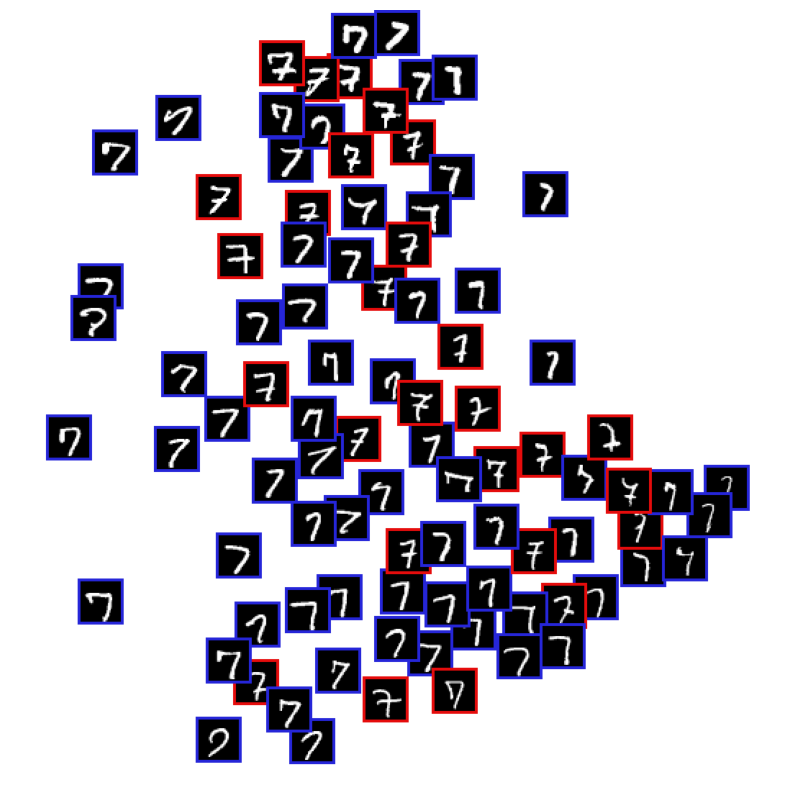

514
514
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 60 	Training Loss: 10.189984


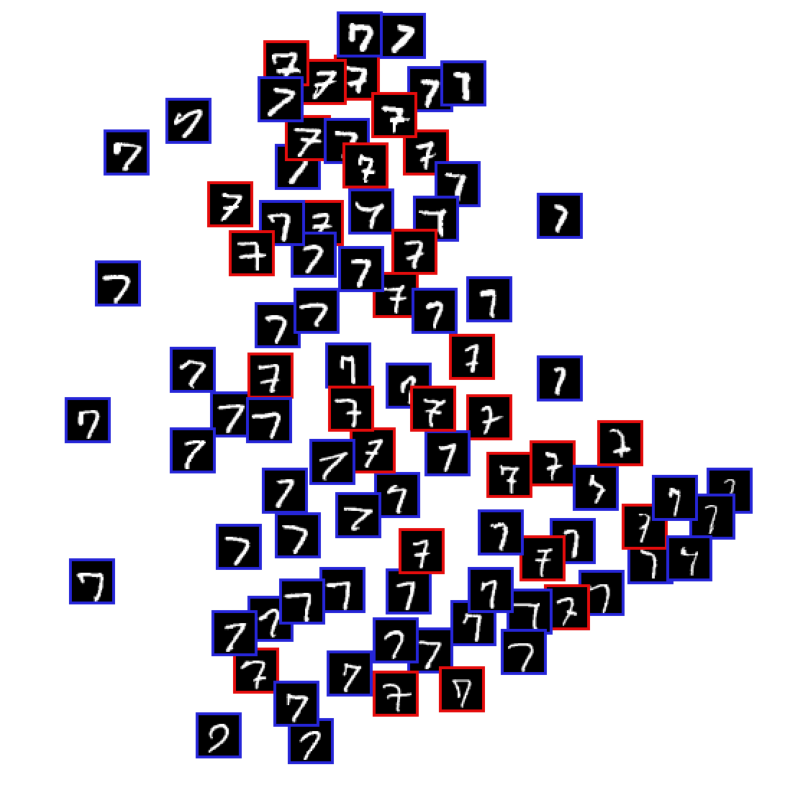

519
509
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 61 	Training Loss: 9.741560


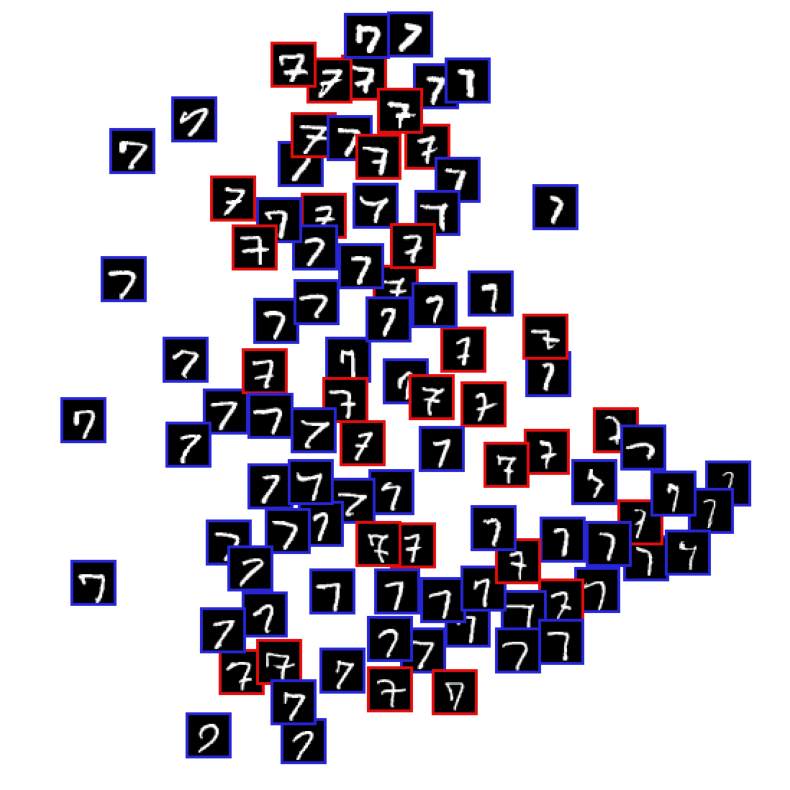

522
506
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 62 	Training Loss: 10.004164


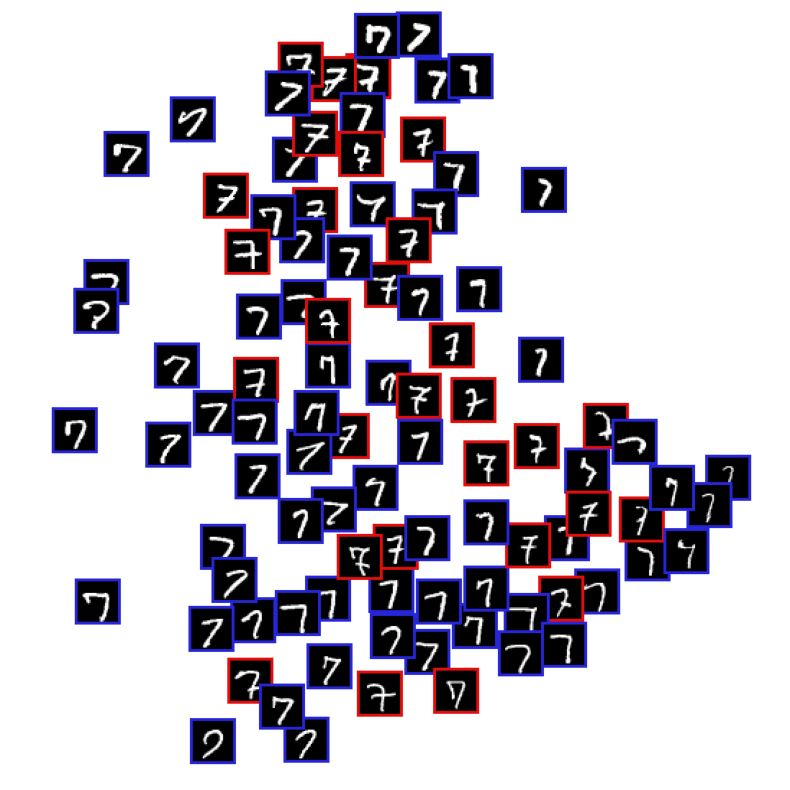

516
512
GM balanced accuracy score with hand-crafted labels :  0.6102853032845841
GM ari with hand-crafted labels :  0.03389951171814468
GM vm with hand-crafted labels :  0.027066879354808525
Epoch: 63 	Training Loss: 9.893003


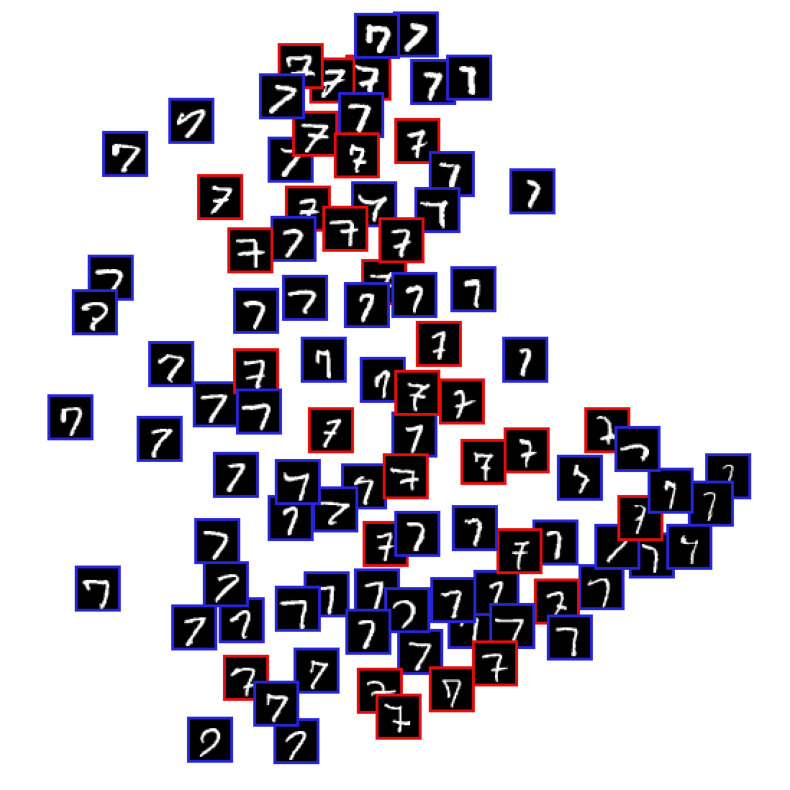

525
503
GM balanced accuracy score with hand-crafted labels :  0.6121176833236291
GM ari with hand-crafted labels :  0.03236487056869421
GM vm with hand-crafted labels :  0.02806479679833672
Epoch: 64 	Training Loss: 8.955232


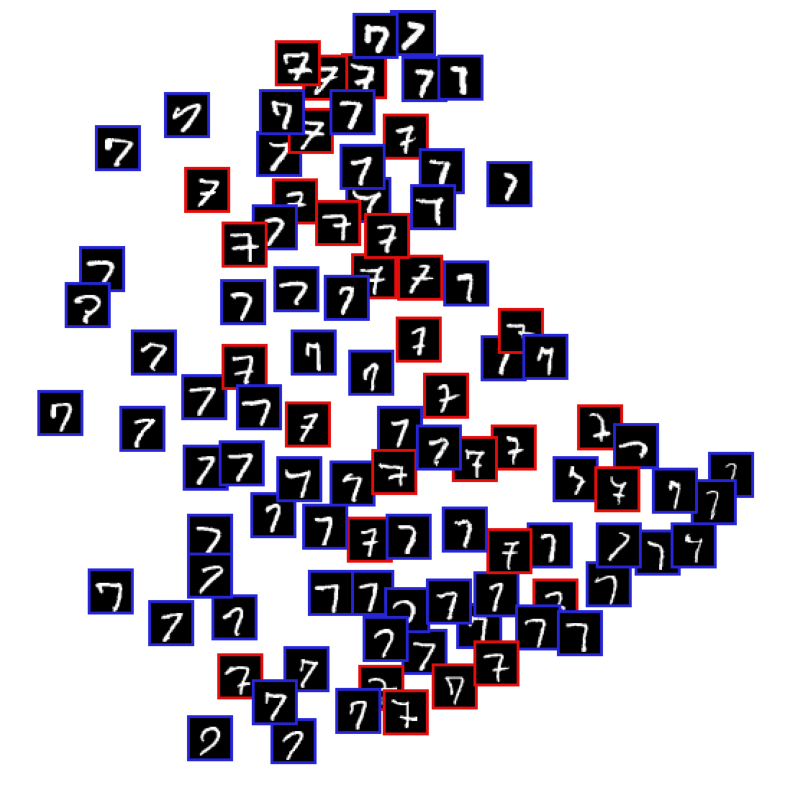

527
501
GM balanced accuracy score with hand-crafted labels :  0.6121176833236291
GM ari with hand-crafted labels :  0.03236487056869421
GM vm with hand-crafted labels :  0.02806479679833672
Epoch: 65 	Training Loss: 9.596939


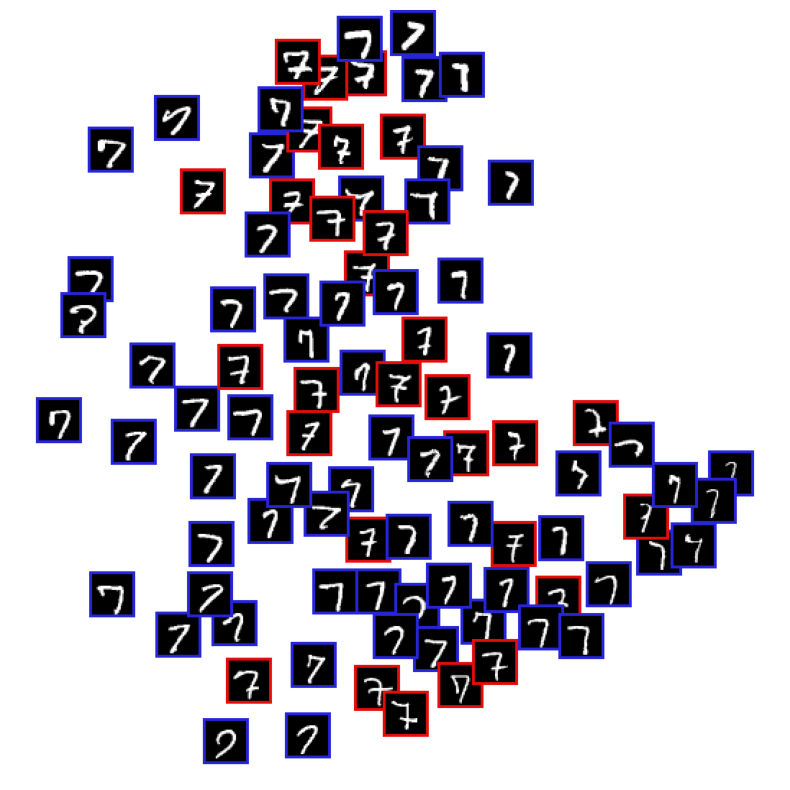

521
507
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
Epoch: 66 	Training Loss: 9.723617


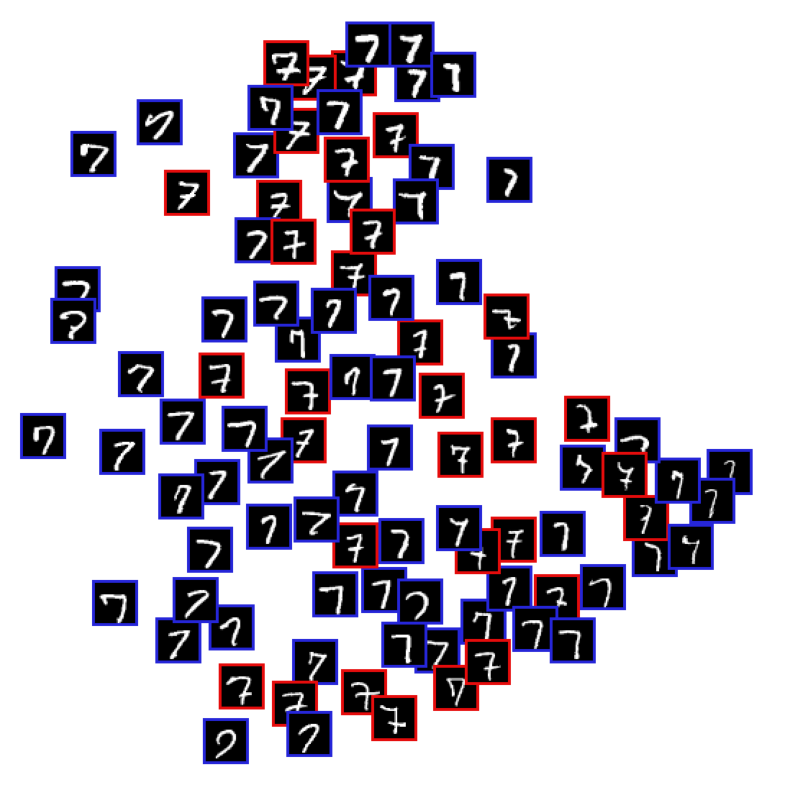

511
517
GM balanced accuracy score with hand-crafted labels :  0.6119464328526903
GM ari with hand-crafted labels :  0.035702594196924516
GM vm with hand-crafted labels :  0.02796028605248097
Epoch: 67 	Training Loss: 9.171194


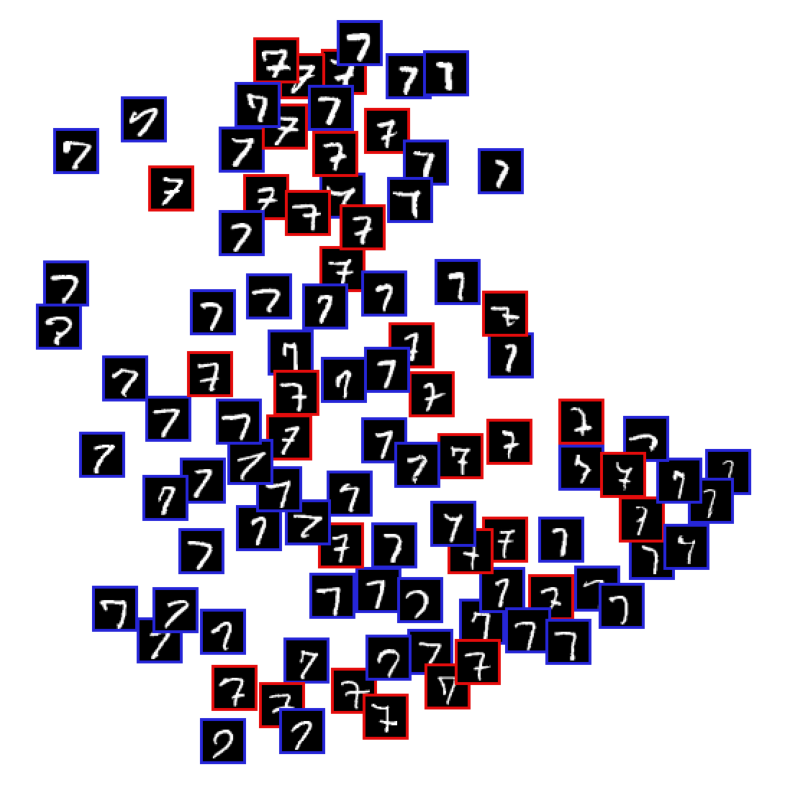

508
520
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 68 	Training Loss: 9.842090


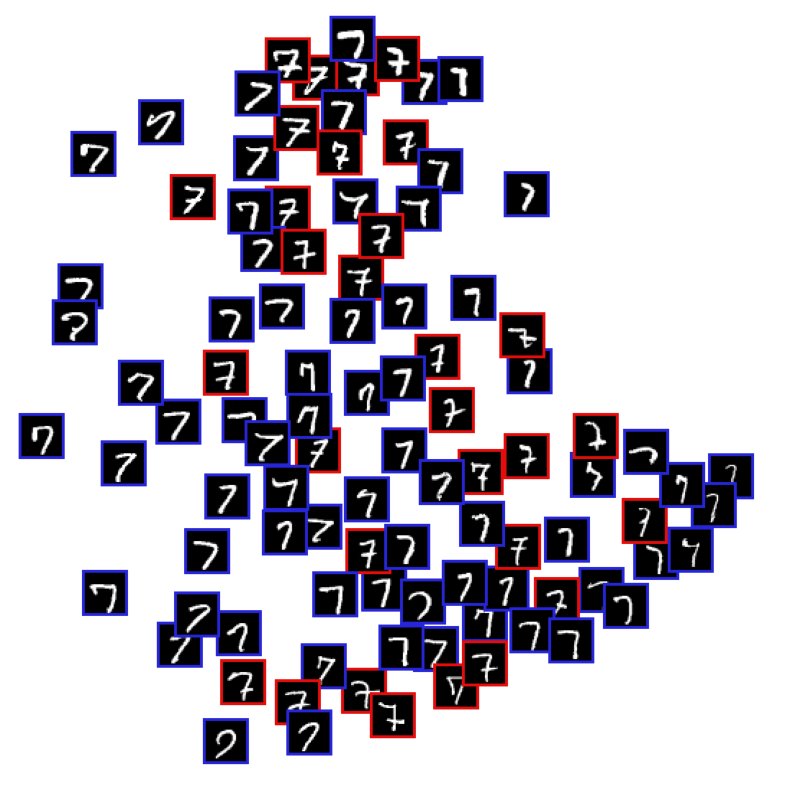

508
520
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 69 	Training Loss: 9.099936


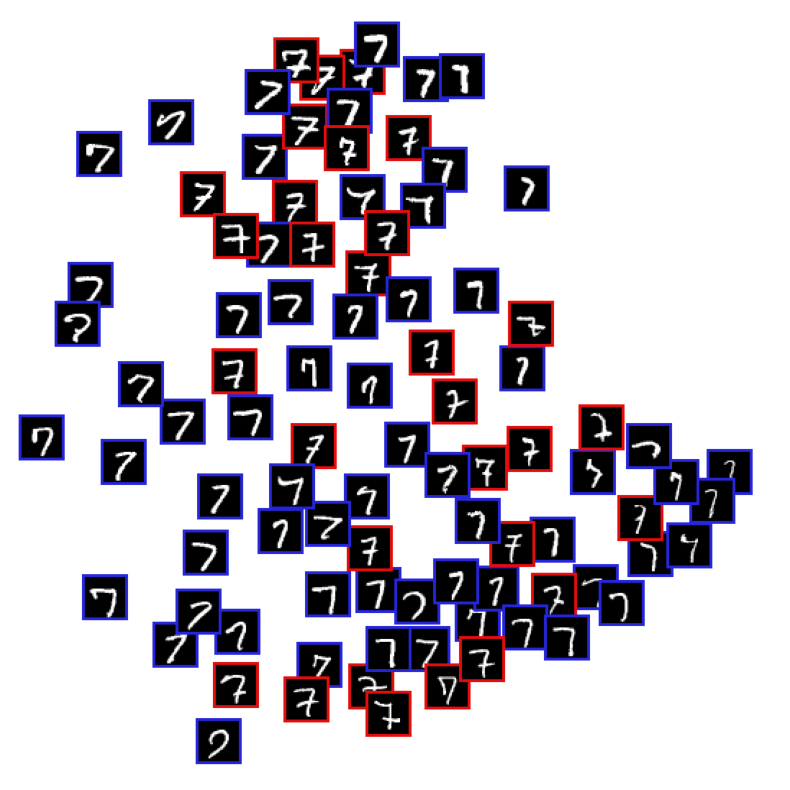

508
520
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 70 	Training Loss: 9.222638


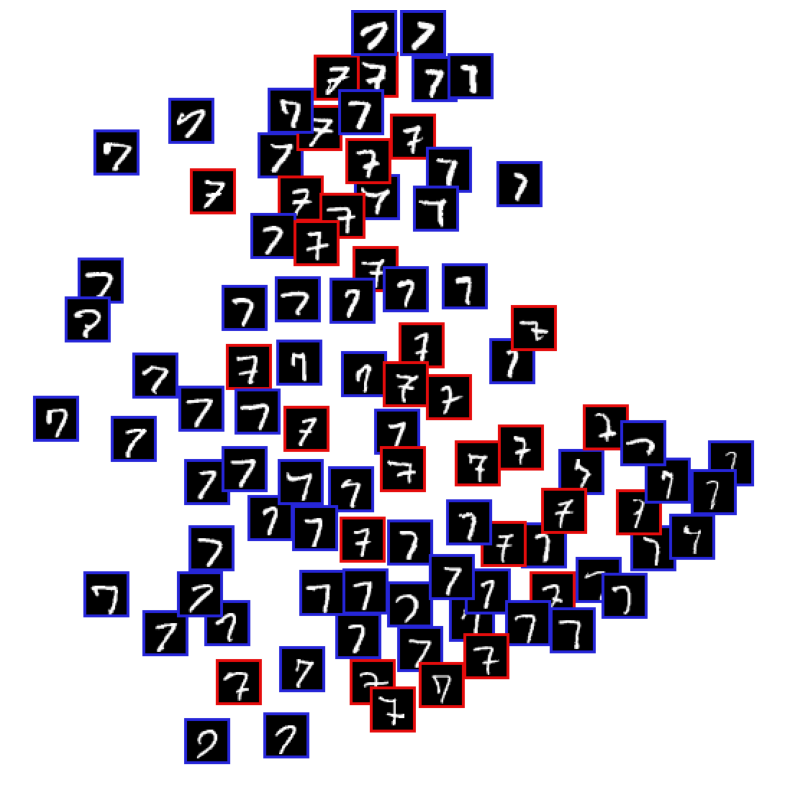

523
505
GM balanced accuracy score with hand-crafted labels :  0.6121176833236291
GM ari with hand-crafted labels :  0.03236487056869421
GM vm with hand-crafted labels :  0.02806479679833672
Epoch: 71 	Training Loss: 10.502648


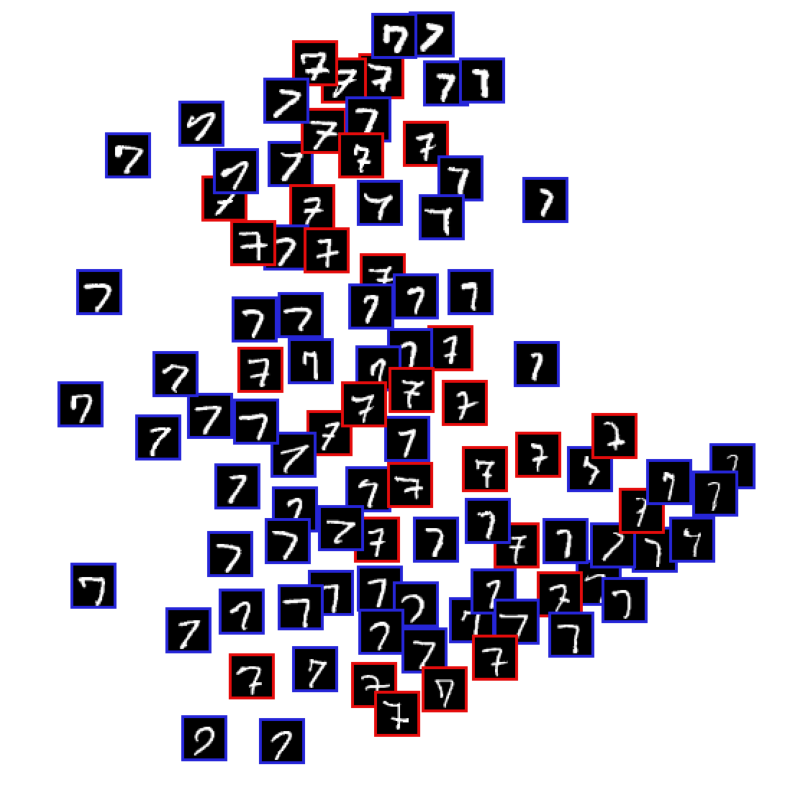

521
507
GM balanced accuracy score with hand-crafted labels :  0.6086241737164777
GM ari with hand-crafted labels :  0.03213482423821349
GM vm with hand-crafted labels :  0.026188834142321125
Epoch: 72 	Training Loss: 10.153232


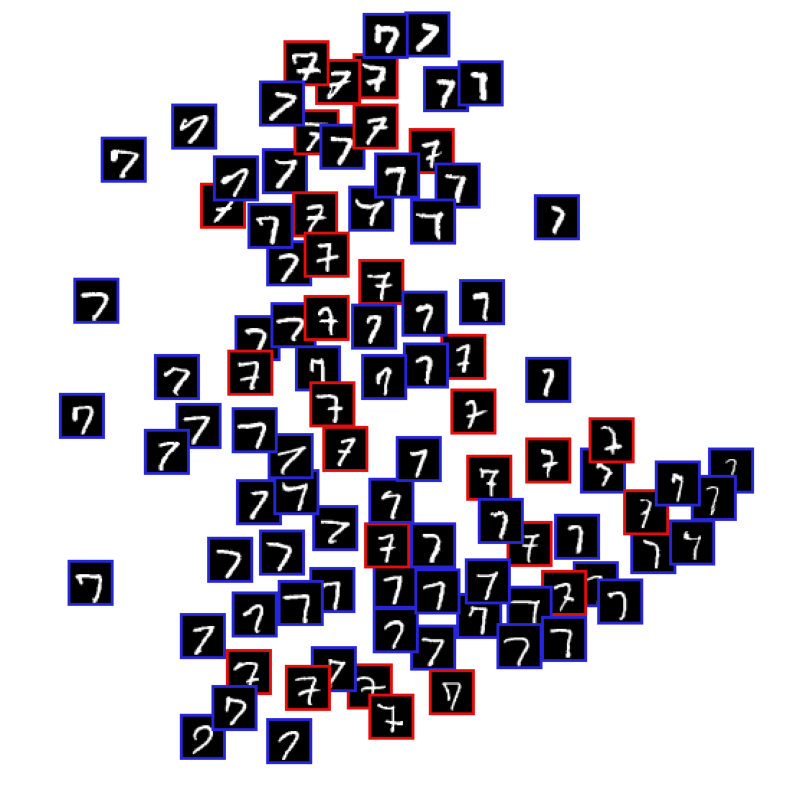

514
514
GM balanced accuracy score with hand-crafted labels :  0.6154399424598418
GM ari with hand-crafted labels :  0.035982792084933296
GM vm with hand-crafted labels :  0.02988662602006209
Epoch: 73 	Training Loss: 9.755383


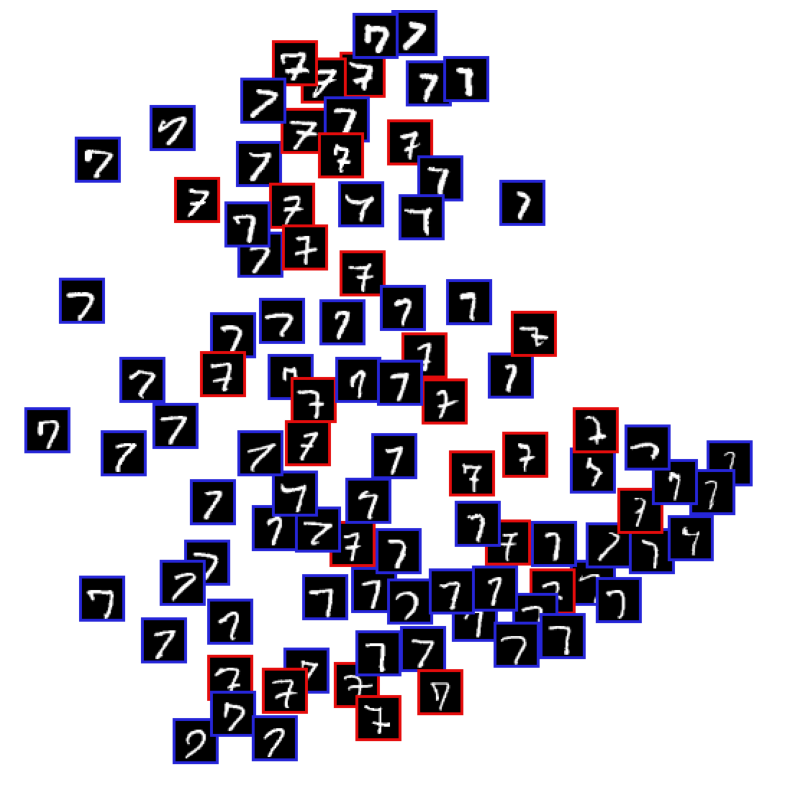

511
517
GM balanced accuracy score with hand-crafted labels :  0.6136075624207966
GM ari with hand-crafted labels :  0.0375441606549137
GM vm with hand-crafted labels :  0.028869221536446124
Epoch: 74 	Training Loss: 9.778825


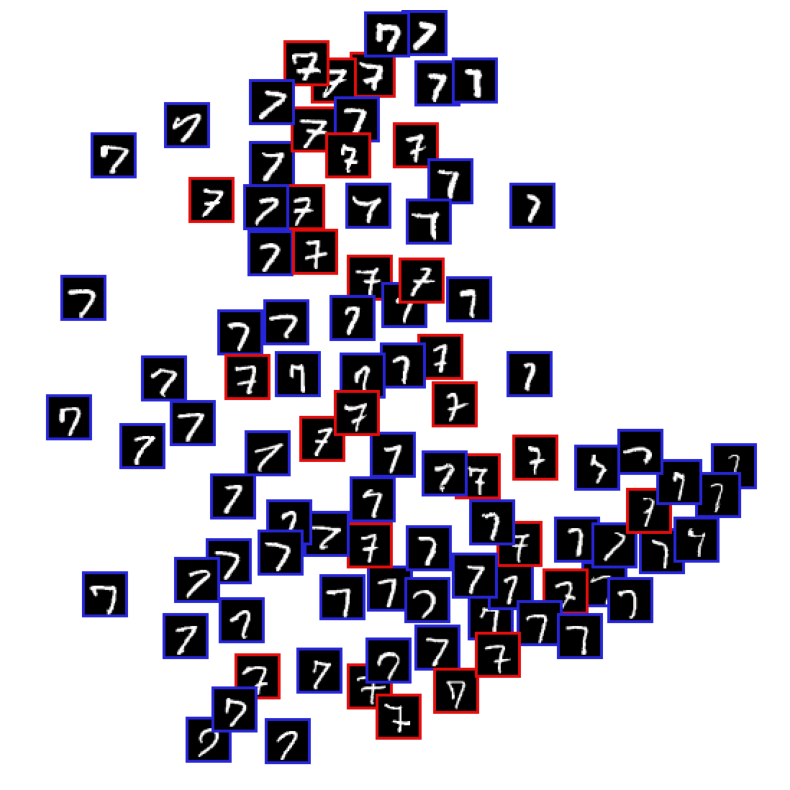

511
517
GM balanced accuracy score with hand-crafted labels :  0.6119464328526903
GM ari with hand-crafted labels :  0.035702594196924516
GM vm with hand-crafted labels :  0.02796028605248097
Epoch: 75 	Training Loss: 9.856684


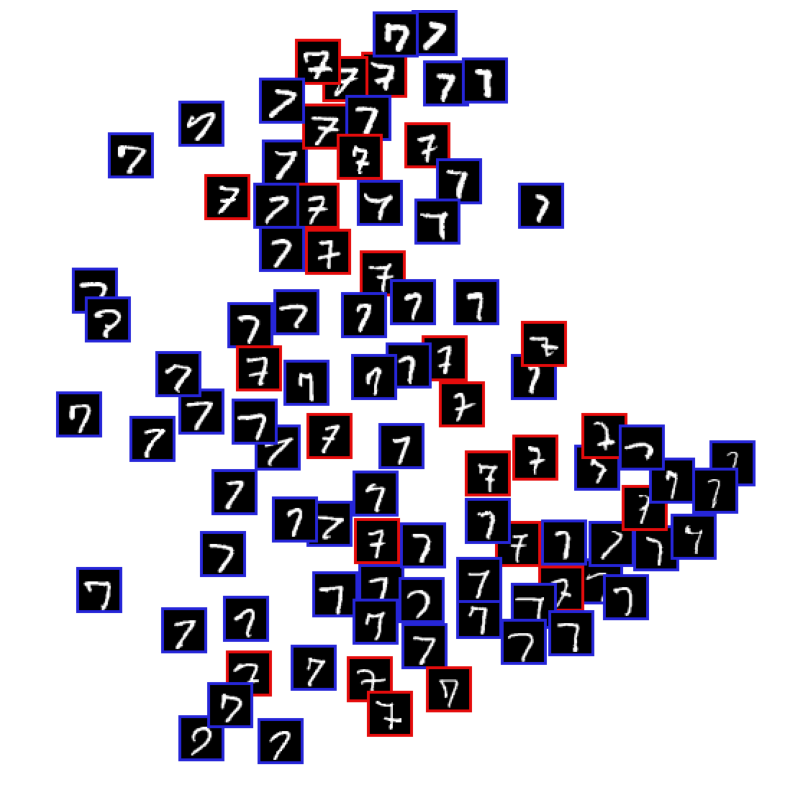

516
512
GM balanced accuracy score with hand-crafted labels :  0.6137788128917354
GM ari with hand-crafted labels :  0.034154681349465595
GM vm with hand-crafted labels :  0.028968085416197994
0:33:03.673861
------------------------------------------------------------------


In [ ]:
import datetime

# number of epochs to train the model
n_epochs = 75
lr = 0.00001
batch_size = 256

for run in range(0, 1) :
  begin_time = datetime.datetime.now()

  # build model
  conditional_classifier_model = SimpleConditionalConvNet(nc, nz, n_clusters).float().cuda()
  conditional_classifier_model.eval()

  # dataloaders
  train_data = MyDataset(X_train)
  test_data = MyDataset(X_test, test=True)
  # prepare data loaders
  train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
  test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)

  # specify loss function
  list_of_parameters = []
  list_of_parameters.extend(conditional_classifier_model.parameters())
  optimizer = torch.optim.Adam(list_of_parameters, lr=lr)

  train_losses = []
  test_losses = []
  test_accuracies = []
  train_accuracies = []
  clustering_stabilities = []

  for epoch in range(1, n_epochs+1):
      # monitor training loss
      train_loss = 0.0
      test_loss = 0.0

      ###################
      # train the model #
      ###################
      conditional_classifier_model.train()
      train_accuracy=0.0
      for data in train_loader:
          # _ stands in for labels, here no need to flatten images
          images_1, images_2 = data
          # clear the gradients of all optimized variables
          optimizer.zero_grad()
          # forward pass: compute predicted outputs by passing inputs to the model
          _, p_1 = conditional_classifier_model.forward(images_1)
          _, p_2 = conditional_classifier_model.forward(images_2)
          # apply SK
          with torch.no_grad():
            q_1 = distributed_sinkhorn(p_1)
            q_2 = distributed_sinkhorn(p_2)
          # swap prediction problem
          loss = - 0.5 * (q_1 * torch.log(p_2) + q_2 * torch.log(p_1)).mean()
          # backward pass: compute gradient of the loss with respect to model parameters
          loss.backward()
          # perform a single optimization step (parameter update)
          optimizer.step()
          # normalize prototypes
          conditional_classifier_model.prototypes.weight.data = torch.nn.functional.normalize(conditional_classifier_model.prototypes.weight.data, dim=1, p=2)
          # update running training loss
          train_loss += loss.item()*images_1.size(0)

      # print avg training statistics
      train_loss = train_loss/len(train_loader)
      #
      train_losses.append(train_loss)
      print('Epoch: {} \tTraining Loss: {:.6f}'.format(
          epoch,
          train_loss
          ))

      with torch.no_grad():
          # EVALUATE THE MODEL
          train_data = MyDataset(X_train, test=True)
          test_data = MyDataset(X_test, test=True)
          train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
          test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)
          with torch.no_grad() :
            # TRAIN
            X_train_latent = torch.zeros((0, nz), device="cuda")
            y_train_clustering = torch.zeros((0, n_clusters), device="cuda")
            for data in train_loader:
                images, _ = data
                encoded_vectors, clustering_probabilities = conditional_classifier_model.forward(images)
                X_train_latent = torch.cat((X_train_latent, encoded_vectors), dim=0)
                y_train_clustering = torch.cat((y_train_clustering, clustering_probabilities), dim=0)
            # TEST
            X_test_latent = torch.zeros((0, nz), device="cuda")
            y_test_clustering = torch.zeros((0, n_clusters), device="cuda")
            for data in test_loader:
                images, _ = data
                encoded_vectors, clustering_probabilities = conditional_classifier_model.forward(images)
                X_test_latent = torch.cat((X_test_latent, encoded_vectors), dim=0)
                y_test_clustering = torch.cat((y_test_clustering, clustering_probabilities), dim=0)
            y_test_clustering = y_test_clustering.cpu().numpy()
            y_train_clustering = y_train_clustering.cpu().numpy()

      # PCA
      pca = PCA().fit(X_train_latent.cpu().numpy())
      X_test_latent_pca = pca.transform(X_test_latent.cpu().numpy())
      create_visualization(X_test_latent.cpu().numpy(), X_test, 7*np.ones_like(y_test_clustering[:, 1]), y_ground_truth, y_test_clustering)

      for label in [0, 1] :
        print(np.sum(np.argmax(y_test_clustering, axis=1)==label))

      print("GM balanced accuracy score with hand-crafted labels : ",
            max(balanced_accuracy_score(y_ground_truth, np.argmax(y_test_clustering[:len(y_ground_truth)], 1)),
            balanced_accuracy_score(1-y_ground_truth, np.argmax(y_test_clustering[:len(y_ground_truth)], 1))))
      print("GM ari with hand-crafted labels : ", ARI(y_ground_truth,
                                                      np.argmax(y_test_clustering[:len(y_ground_truth)], 1)))
      print("GM vm with hand-crafted labels : ", AMI(y_ground_truth,
                                                      np.argmax(y_test_clustering[:len(y_ground_truth)], 1)))

      # train dataloaders
      train_data = MyDataset(X_train)
      train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
      # test dataloaders
      test_data = MyDataset(X_test)
      test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size)

  print(datetime.datetime.now() - begin_time)


  print('------------------------------------------------------------------')

In [ ]:
swav_results = [0.6018, 0.5898, 0.6137]

print(np.mean(swav_results))
print(np.std(swav_results))

0.6017666666666667
0.009757162611242187


In [ ]:
print(datetime.datetime.now() - begin_time)
# 0:27:46.132543

0:33:03.705510
